In [17]:
#Importing all required packages

import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import matplotlib as mpt
import seaborn
import statistics as st
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.inspection import permutation_importance
import plotly.express as px
import numpy as np
import calendar
from category_encoders.cat_boost import CatBoostEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from sklearn.model_selection import TimeSeriesSplit
from matplotlib.gridspec import GridSpec
from statsmodels.tsa.arima_model import ARIMA
import statsmodels.tsa.stattools as stattools
from datetime import timedelta
import warnings
warnings.filterwarnings('ignore')

In [18]:
#This is the soruce code for MAPE from the latest version of scikit-learn.
#I had to pick it from the source code because my there were issues when I tried to update my scikit-learn to the latest version

from sklearn.utils.validation import check_consistent_length, check_array

def mean_absolute_percentage_error(y_true, y_pred,
                                   sample_weight=None,
                                   multioutput='uniform_average'):
    """Mean absolute percentage error regression loss.
    Note here that we do not represent the output as a percentage in range
    [0, 100]. Instead, we represent it in range [0, 1/eps]. Read more in the
    :ref:`User Guide <mean_absolute_percentage_error>`.
    .. versionadded:: 0.24
    Parameters
    ----------
    y_true : array-like of shape (n_samples,) or (n_samples, n_outputs)
        Ground truth (correct) target values.
    y_pred : array-like of shape (n_samples,) or (n_samples, n_outputs)
        Estimated target values.
    sample_weight : array-like of shape (n_samples,), default=None
        Sample weights.
    multioutput : {'raw_values', 'uniform_average'} or array-like
        Defines aggregating of multiple output values.
        Array-like value defines weights used to average errors.
        If input is list then the shape must be (n_outputs,).
        'raw_values' :
            Returns a full set of errors in case of multioutput input.
        'uniform_average' :
            Errors of all outputs are averaged with uniform weight.
    Returns
    -------
    loss : float or ndarray of floats in the range [0, 1/eps]
        If multioutput is 'raw_values', then mean absolute percentage error
        is returned for each output separately.
        If multioutput is 'uniform_average' or an ndarray of weights, then the
        weighted average of all output errors is returned.
        MAPE output is non-negative floating point. The best value is 0.0.
        But note the fact that bad predictions can lead to arbitarily large
        MAPE values, especially if some y_true values are very close to zero.
        Note that we return a large value instead of `inf` when y_true is zero.
    Examples
    --------
    >>> from sklearn.metrics import mean_absolute_percentage_error
    >>> y_true = [3, -0.5, 2, 7]
    >>> y_pred = [2.5, 0.0, 2, 8]
    >>> mean_absolute_percentage_error(y_true, y_pred)
    0.3273...
    >>> y_true = [[0.5, 1], [-1, 1], [7, -6]]
    >>> y_pred = [[0, 2], [-1, 2], [8, -5]]
    >>> mean_absolute_percentage_error(y_true, y_pred)
    0.5515...
    >>> mean_absolute_percentage_error(y_true, y_pred, multioutput=[0.3, 0.7])
    0.6198...
    """
    y_type, y_true, y_pred, multioutput = _check_reg_targets(
        y_true, y_pred, multioutput)
    check_consistent_length(y_true, y_pred, sample_weight)
    epsilon = np.finfo(np.float64).eps
    mape = np.abs(y_pred - y_true) / np.maximum(np.abs(y_true), epsilon)
    output_errors = np.average(mape,
                               weights=sample_weight, axis=0)
    if isinstance(multioutput, str):
        if multioutput == 'raw_values':
            return output_errors
        elif multioutput == 'uniform_average':
            # pass None as weights to np.average: uniform mean
            multioutput = None

    return np.average(output_errors, weights=multioutput)

def _check_reg_targets(y_true, y_pred, multioutput, dtype="numeric"):
    """Check that y_true and y_pred belong to the same regression task.
    Parameters
    ----------
    y_true : array-like
    y_pred : array-like
    multioutput : array-like or string in ['raw_values', uniform_average',
        'variance_weighted'] or None
        None is accepted due to backward compatibility of r2_score().
    Returns
    -------
    type_true : one of {'continuous', continuous-multioutput'}
        The type of the true target data, as output by
        'utils.multiclass.type_of_target'.
    y_true : array-like of shape (n_samples, n_outputs)
        Ground truth (correct) target values.
    y_pred : array-like of shape (n_samples, n_outputs)
        Estimated target values.
    multioutput : array-like of shape (n_outputs) or string in ['raw_values',
        uniform_average', 'variance_weighted'] or None
        Custom output weights if ``multioutput`` is array-like or
        just the corresponding argument if ``multioutput`` is a
        correct keyword.
    dtype : str or list, default="numeric"
        the dtype argument passed to check_array.
    """
    check_consistent_length(y_true, y_pred)
    y_true = check_array(y_true, ensure_2d=False, dtype=dtype)
    y_pred = check_array(y_pred, ensure_2d=False, dtype=dtype)

    if y_true.ndim == 1:
        y_true = y_true.reshape((-1, 1))

    if y_pred.ndim == 1:
        y_pred = y_pred.reshape((-1, 1))

    if y_true.shape[1] != y_pred.shape[1]:
        raise ValueError("y_true and y_pred have different number of output "
                         "({0}!={1})".format(y_true.shape[1], y_pred.shape[1]))

    n_outputs = y_true.shape[1]
    allowed_multioutput_str = ('raw_values', 'uniform_average',
                               'variance_weighted')
    if isinstance(multioutput, str):
        if multioutput not in allowed_multioutput_str:
            raise ValueError("Allowed 'multioutput' string values are {}. "
                             "You provided multioutput={!r}".format(
                                 allowed_multioutput_str,
                                 multioutput))
    elif multioutput is not None:
        multioutput = check_array(multioutput, ensure_2d=False)
        if n_outputs == 1:
            raise ValueError("Custom weights are useful only in "
                             "multi-output cases.")
        elif n_outputs != len(multioutput):
            raise ValueError(("There must be equally many custom weights "
                              "(%d) as outputs (%d).") %
                             (len(multioutput), n_outputs))
    y_type = 'continuous' if n_outputs == 1 else 'continuous-multioutput'

    return y_type, y_true, y_pred, multioutput

# Reading, cleaning and pre-processing the dataset


In [19]:
raw_df=pd.read_csv("sample-data-sales.csv")
print(raw_df.isnull().values.any())

False


In [20]:
def cleanDates(text):
#     print(text)
    for fmt in ('%m/%d/%Y', '%m/%d/%y'):
        try:
            return datetime.strptime(text, fmt)
        except ValueError:
            pass
    raise ValueError('no valid date format found')

In [21]:
raw_df['Order Date']=raw_df['Order Date'].apply(cleanDates)
raw_df['Ship Date']=raw_df['Ship Date'].apply(cleanDates)

# Exploratory Data Analysis and Feature Engineering

Let us mainly try to examine the distribution of the target variable across various sections of the data to try and find out any possible patterns.


In [22]:
raw_df['Days to Ship']=raw_df.apply(lambda x: (x['Ship Date']-x['Order Date']).days, axis=1)   #Creating the target variable

In [23]:
DaystoShipCounts=raw_df.groupby('Days to Ship')['Days to Ship'].count()
print(DaystoShipCounts)   #Checking count of occurence of each value of the target variable

Days to Ship
0     19638
1     19460
2     19698
3     19636
4     19649
5     19493
6     19472
7     19673
8     19405
9     19395
10    19443
11    19678
12    19750
13    19620
14    19483
15    19680
16    19534
17    19793
18    19592
19    19619
20    19520
21    19709
22    19817
23    19496
24    19642
25    19533
26    19698
27    19667
28    19425
29    19639
30    19622
31    19754
32    19530
33    19581
34    19599
35    19632
36    19702
37    19433
38    19527
39    19678
40    19668
41    19735
42    19503
43    19702
44    19751
45    19611
46    19604
47    19544
48    19480
49    19790
50    19697
Name: Days to Ship, dtype: int64


<b>As we can see, the target variable shows a uniform distribution over the entire data. Our hope during the EDA process is to find a particular segment of the data where the distribution is not uniform, which would indicate a pattern in the data that wee can exploit.</b>

In [24]:
countryMedians=raw_df.groupby('Country')['Days to Ship'].mean()
print(countryMedians)

Country
Afghanistan     24.679224
Albania         25.186438
Algeria         24.930047
Andorra         24.969500
Angola          25.395034
                  ...    
Vatican City    25.219672
Vietnam         24.909633
Yemen           25.257516
Zambia          25.223933
Zimbabwe        24.896307
Name: Days to Ship, Length: 185, dtype: float64


<b>All countries showed the same mean target value</b>

In [25]:
pd.crosstab(raw_df['Unit Price'], raw_df['Item Type'])

Item Type,Baby Food,Beverages,Cereal,Clothes,Cosmetics,Fruits,Household,Meat,Office Supplies,Personal Care,Snacks,Vegetables
Unit Price,,,,,,,,,,,,
9.33,0,0,0,0,0,83551,0,0,0,0,0,0
47.45,0,83326,0,0,0,0,0,0,0,0,0,0
81.73,0,0,0,0,0,0,0,0,0,83539,0,0
109.28,0,0,0,83240,0,0,0,0,0,0,0,0
152.58,0,0,0,0,0,0,0,0,0,0,83448,0
154.06,0,0,0,0,0,0,0,0,0,0,0,83170
205.70,0,0,83211,0,0,0,0,0,0,0,0,0
255.28,83397,0,0,0,0,0,0,0,0,0,0,0
421.89,0,0,0,0,0,0,0,83198,0,0,0,0


<b>From the above crosstab, we find that each Item Type has a single Unit Price nd so the Unit Price and Item Type are essentially the same feature.</b>

In [26]:
priceToTypeSeries=raw_df.loc[:,['Item Type', 'Unit Price']]   #Setting up a series to return Item Type for any Unite Price
priceToTypeSeries=priceToTypeSeries.drop_duplicates().set_index('Unit Price')

In [27]:
print(raw_df.loc[:,['Region', 'Country', 'Item Type']].apply(pd.Series.nunique))   #Counting number of unique values in these columns

Region         7
Country      185
Item Type     12
dtype: int64


### Multivariate analysis of various parts of the order date column with respect to the target

The data contained almost 1 million rows and over 7 years of dates, which would have made it difficult to analyze the data. Hence the data was grouped at various levels like Order Date, Month/Year, Month (irrespective of year), day of week and day of month and the mean was taken for each value at each level.

<function matplotlib.pyplot.show(close=None, block=None)>

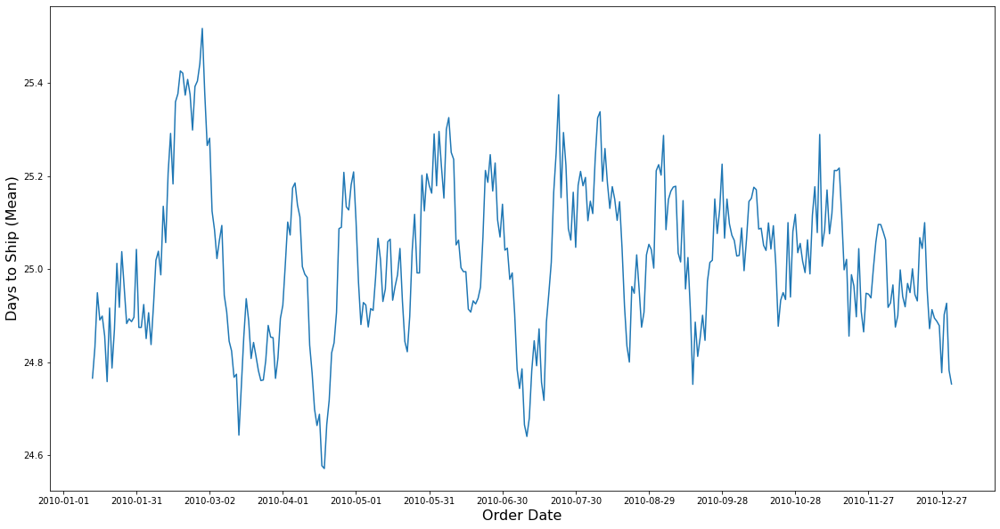

In [28]:
mpt.rcParams['agg.path.chunksize'] = 10000
# raw_df['orderMonth']=raw_df['Order Date'].apply(lambda x: x.strftime('%Y-%m'))
orderDay=pd.DataFrame()
orderDay=raw_df[raw_df['Order Date']<'2011-01-01'].groupby('Order Date')['Days to Ship'].mean()    #Creating a new feature for month of Order
orderDaymavg=orderDay.rolling(window=12).mean().shift(1)
plt.figure(figsize=(19,10))
plt.xlabel("Order Date", fontsize=16)
plt.ylabel("Days to Ship (Mean)", fontsize=16)
plt.plot(orderDaymavg.index, orderDaymavg)
plt.xticks(orderDay.index[::30])
plt.show

<b>Here, the data was examined at a day level for 2010 (for the sake of visualization). Moving average (with window=12) was taken for the data for smoothing purpouses. We see here that the data still doesn't show any apparent pattern for the target with respect to the order date. </b>

<function matplotlib.pyplot.show(close=None, block=None)>

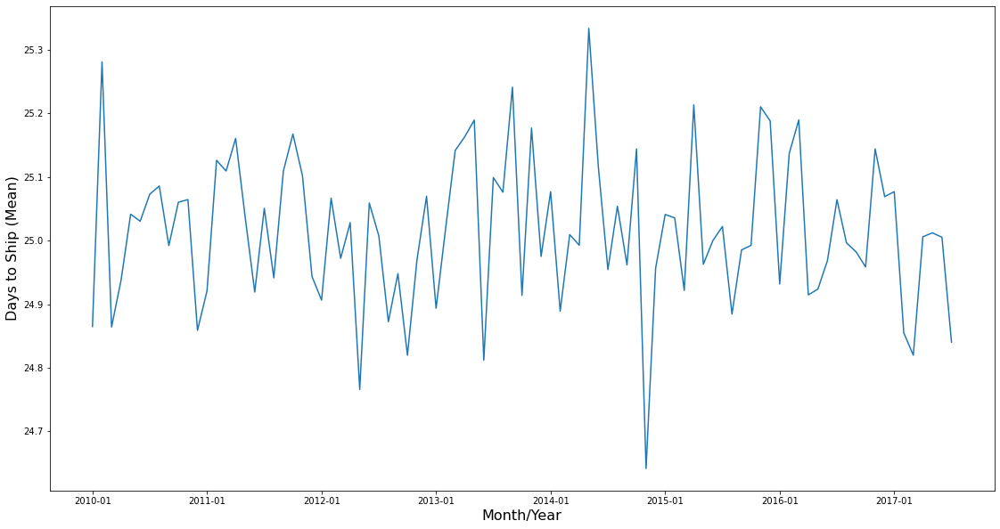

In [29]:
mpt.rcParams['agg.path.chunksize'] = 10000
raw_df['orderMonth']=raw_df['Order Date'].apply(lambda x: x.strftime('%Y-%m'))
orderMonth=pd.DataFrame()
orderMonth=raw_df.groupby('orderMonth')['Days to Ship'].mean()    #Creating a new feature for month of Order
orderMonthmavg=orderMonth.rolling(window=12).mean().shift(1)
plt.figure(figsize=(19,10))
plt.xlabel("Month/Year", fontsize=16)
plt.ylabel("Days to Ship (Mean)", fontsize=16)
plt.plot(orderMonth.index, orderMonth)
plt.xticks(orderMonth.index[::12])
plt.show

<b>Here, the data was examined at a month/year level. We see here that the data still doesn't show any apparent pattern for the target with respect to month/year of order date. </b>

<function matplotlib.pyplot.show(close=None, block=None)>

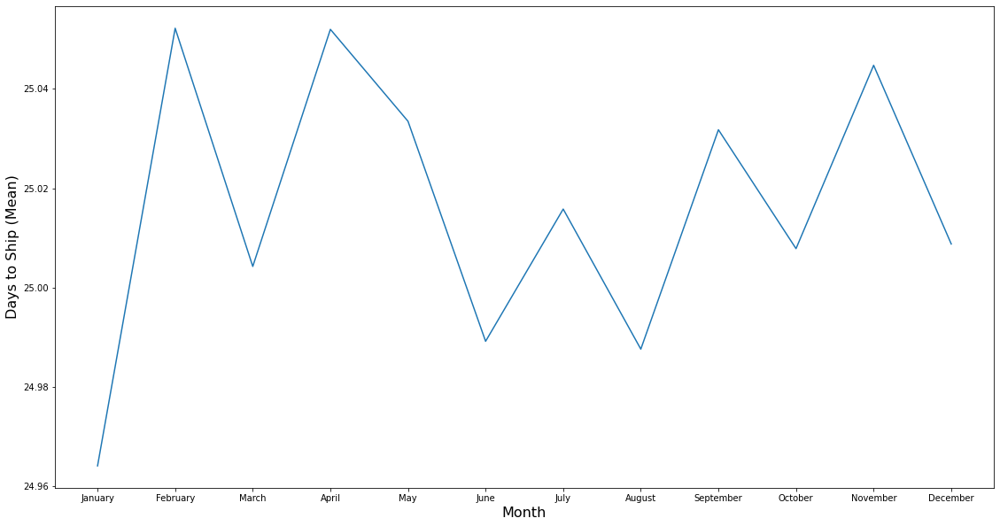

In [30]:
time_df=raw_df.loc[:,['Ship Date', 'Order Date', 'Days to Ship']]
time_df['Month']=time_df['Order Date'].apply(lambda x: x.month)
orderMonthofYear=pd.DataFrame()
orderMonthofYear=time_df.groupby('Month')['Days to Ship'].mean()
plt.figure(figsize=(19,10))
plt.xlabel("Month", fontsize=16)
plt.ylabel("Days to Ship (Mean)", fontsize=16)
plt.plot(orderMonthofYear.index, orderMonthofYear)
plt.xticks(ticks=orderMonthofYear.index, labels=calendar.month_name[1:])
plt.show

<b>The data was examined for any pattern at the Month level (irrespective of year) to check for yearly seasonalities. We plotted the mean value of target for each month. As we see in the chart above, judging from the low variance of the target across various months, no pattern was found here.</b>

<function matplotlib.pyplot.show(close=None, block=None)>

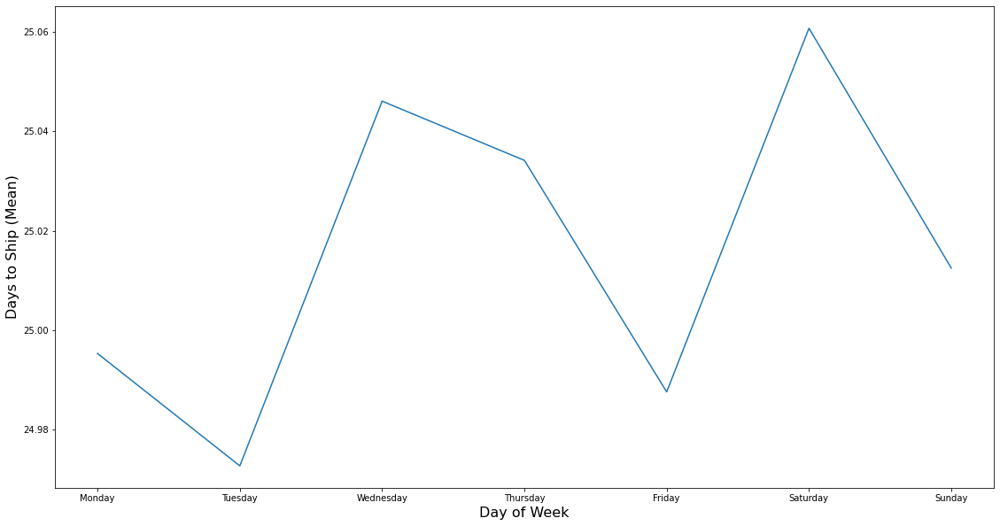

In [31]:
time_df['Week']=time_df['Order Date'].apply(lambda x: x.dayofweek)
orderDay=pd.DataFrame()
orderDay=time_df.groupby('Week')['Days to Ship'].mean()
plt.figure(figsize=(19,10))
plt.xlabel("Day of Week", fontsize=16)
plt.ylabel("Days to Ship (Mean)", fontsize=16)
plt.plot(orderDay.index, orderDay)
plt.xticks(ticks=orderDay.index, labels=calendar.day_name)
plt.show

<b>The same analysis was done at a Day-of-Week level. Again, no pattern found.</b>

<function matplotlib.pyplot.show(close=None, block=None)>

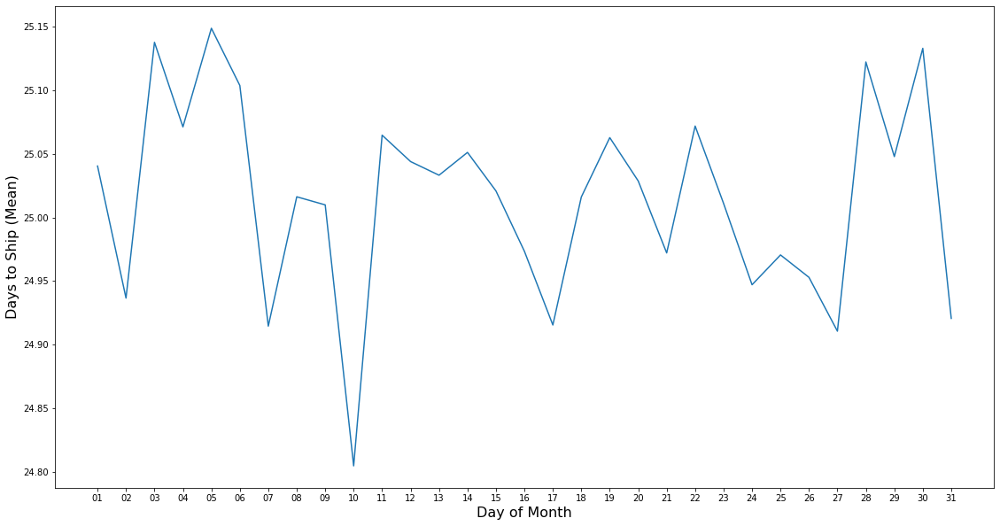

In [32]:
time_df['DayofMonth']=time_df['Order Date'].apply(lambda x: x.strftime('%d'))
orderDayofMonth=pd.DataFrame()
orderDayofMonth=time_df.groupby('DayofMonth')['Days to Ship'].mean()
plt.figure(figsize=(19,10))
plt.xlabel("Day of Month", fontsize=16)
plt.ylabel("Days to Ship (Mean)", fontsize=16)
plt.plot(orderDayofMonth.index, orderDayofMonth)
plt.show

<b>The same analysis at a Day-of-Month level revealed no pattern either</b>

### Multivariate analysis for categorical columns with respect to the target

Now, to check for patterns in the data across the various categories in the categorical columns, the distribution of the target variable was plotted across all categories for all categorical columns. This was done using violin plots. If any difference is noted in the violin plots across the various categories in a feature, this would indicate a pattern in the data.

<AxesSubplot:xlabel='Region', ylabel='Days to Ship'>

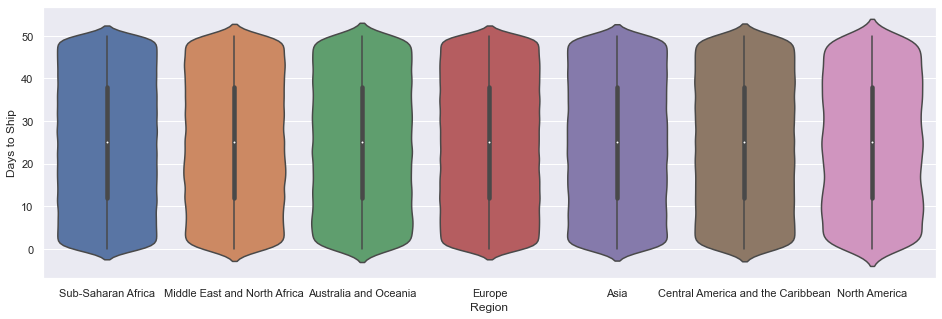

In [33]:
seaborn.set(rc={'figure.figsize':(16,5)})
seaborn.violinplot(x ="Region",
             y ="Days to Ship",
             data = raw_df)

<AxesSubplot:xlabel='Item Type', ylabel='Days to Ship'>

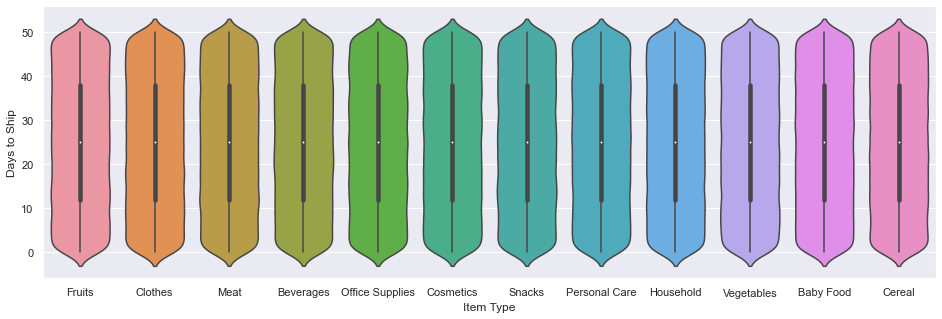

In [34]:
seaborn.set(rc={'figure.figsize':(16,5)})
seaborn.violinplot(x ="Item Type",
             y ="Days to Ship",
             data = raw_df)

<AxesSubplot:xlabel='Order Priority', ylabel='Days to Ship'>

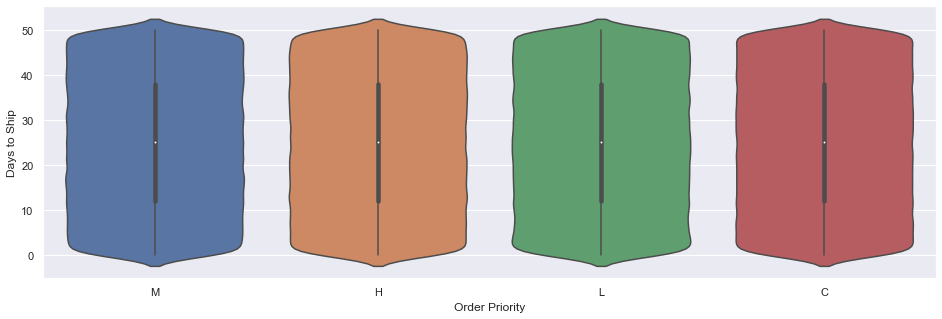

In [35]:
seaborn.set(rc={'figure.figsize':(16,5)})
seaborn.violinplot(x ="Order Priority",
             y ="Days to Ship",
             data = raw_df)

<AxesSubplot:xlabel='Sales Channel', ylabel='Days to Ship'>

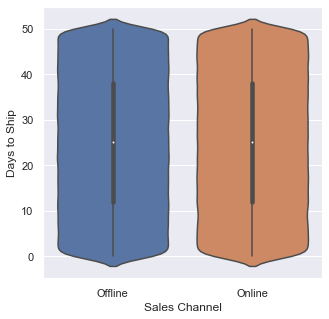

In [36]:
seaborn.set(rc={'figure.figsize':(5,5)})
seaborn.violinplot(x ="Sales Channel",
             y ="Days to Ship",
             data = raw_df)

<AxesSubplot:xlabel='Unit Price', ylabel='Days to Ship'>

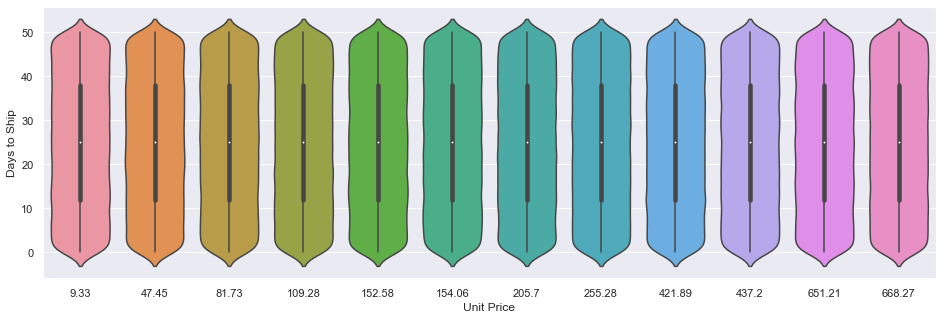

In [37]:
seaborn.set(rc={'figure.figsize':(16,5)})
seaborn.violinplot(x ="Unit Price",
             y ="Days to Ship",
             data = raw_df)

<b>As we can see, no pattern was found for any of the categorical features from the violin plots and all features showed the same uniform distribution across all categories. So no apparent pattern was found through multivariate analysis of the categorical variables with the target.</b>

In [38]:
np.random.seed(12)
gapminder = px.data.gapminder().query("year==2007")

countryMedians=countryMedians.reset_index()
countryMedians.columns=['country', 'count']
countryMedians['country']=countryMedians['country'].replace(['United States of America'], 'United States').replace(['Republic of the Congo'], 'Congo, Rep.').replace(['Yemen'], 'Yemen, Rep.').replace(['Democratic Republic of the Congo'], 'Congo, Dem. Rep.')

df=pd.merge(gapminder, countryMedians, how='left', on='country')

fig = px.choropleth(df, locations="iso_alpha",
                    color="count", 
                    hover_name="country",
                    color_continuous_scale=px.colors.sequential.Plasma)

fig.show()

<b>The mean of each target value was plotted for each country and was plotted in the above chart. Again, we see no significant variance across countries as is evident from the scale in the legend which just varies from around 24.5 to 25.5.</b>

<function matplotlib.pyplot.show(close=None, block=None)>

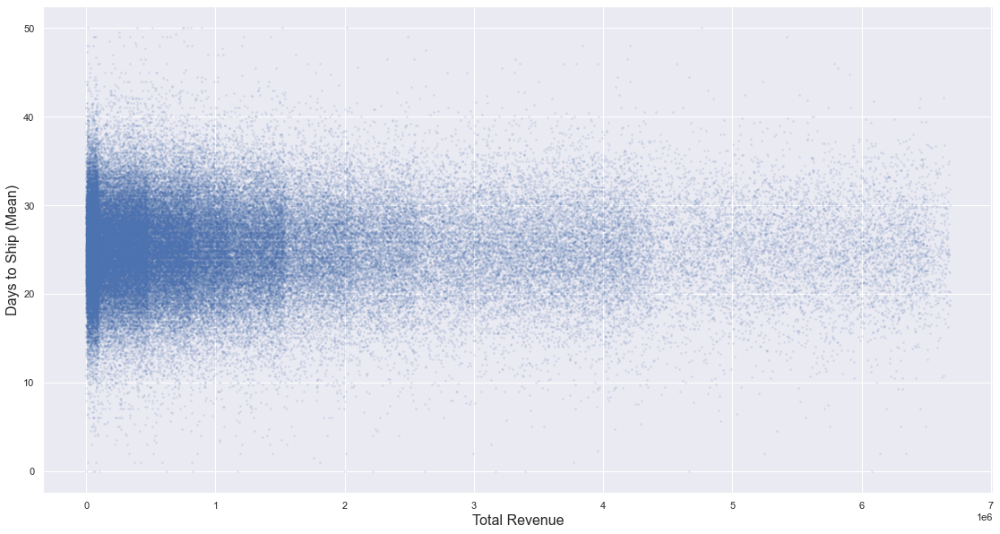

In [39]:
DaystoShipbyRevenue=raw_df.groupby('Total Revenue')['Days to Ship'].mean()
plt.figure(figsize=(19,10))
plt.scatter(DaystoShipbyRevenue.index, DaystoShipbyRevenue, s=3, alpha=0.1)
plt.xlabel("Total Revenue", fontsize=16)
plt.ylabel("Days to Ship (Mean)", fontsize=16)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

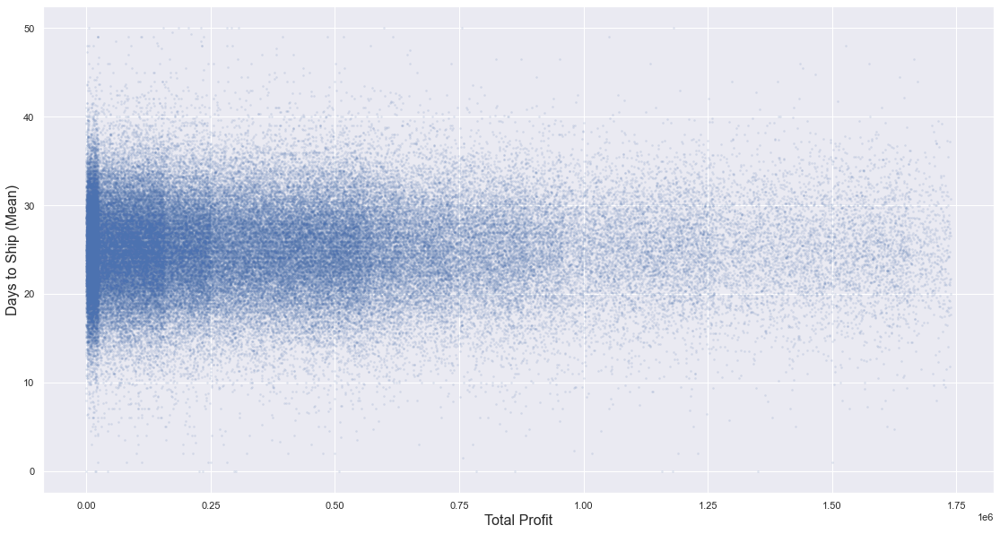

In [40]:
DaystoShipbyProfit=raw_df.groupby('Total Profit')['Days to Ship'].mean()
plt.figure(figsize=(19,10))
plt.scatter(DaystoShipbyProfit.index, DaystoShipbyProfit, s=3, alpha=0.1)
plt.xlabel("Total Profit", fontsize=16)
plt.ylabel("Days to Ship (Mean)", fontsize=16)
plt.show

<b>In the charts above, the target value was plotted against the Total Revenue and Total Profit respectively.

In [41]:
minod=raw_df['Order Date'].min()
raw_df['Order Date Days']=raw_df.apply(lambda x: (x['Order Date']-minod).days, axis=1)
corr=raw_df.corr()
corr.style.background_gradient(cmap='coolwarm')

,Order ID,Units ordered,Unit Price,Unit Cost,Total Revenue,Total Cost,Total Profit,Days to Ship,Order Date Days
Order ID,1.000000,-0.000373,-0.000439,-0.000582,-0.000865,-0.000992,-0.000345,0.000837,0.000203
Units ordered,-0.000373,1.000000,-0.000421,-0.000267,0.522035,0.470408,0.596972,-0.000230,0.000797
Unit Price,-0.000439,-0.000421,1.000000,0.986049,0.738657,0.753593,0.577833,0.000311,-0.000201
Unit Cost,-0.000582,-0.000267,0.986049,1.000000,0.728407,0.764295,0.505636,0.000449,-0.000079
Total Revenue,-0.000865,0.522035,0.738657,0.728407,1.000000,0.987738,0.880791,0.000082,0.000595
Total Cost,-0.000992,0.470408,0.753593,0.764295,0.987738,1.000000,0.796068,0.000193,0.000729
Total Profit,-0.000345,0.596972,0.577833,0.505636,0.880791,0.796068,1.000000,-0.000268,0.000096
Days to Ship,0.000837,-0.000230,0.000311,0.000449,0.000082,0.000193,-0.000268,1.000000,-0.000327
Order Date Days,0.000203,0.000797,-0.000201,-0.000079,0.000595,0.000729,0.000096,-0.000327,1.000000


<b>The correlation matrix was plotted for the numerical features and the target. Although, some of the feature columns showed correlation with each other, there was no correlation observed between any of the features and the target.
    
The feature set was reduced by dropping one of the features for each pair of highly correlated features (as seen below)

    
    
Also, a new feature called 'Order Date Days' was introduced which is a numeric field indicating time difference between the order date for each row and the earliest order date in the data (counted in days).

In [42]:
df_features=raw_df.loc[:,['Country', 'Sales Channel', 'Order Priority', 'Order Date Days', 'Units ordered', 'Unit Price', 'Total Profit']]
df_target=raw_df['Days to Ship']

### Feature importance analysis

A preliminary random forest model was fit for generating feature importances through two methods - Mean Decrease in Impurity (MDI) and Permutation Importance. Label encoding was applied on the categorical columns since tree-based models don't strictly require one-hot encoding and the country columns would have lead to around 180 features if we went with one-hot encoding.

Note that a random column called '<b>randNumCol</b>' was introduced in the data just for this preliminary model. The idea was to arrive at an approximate threshold for retaining/rejecting the actual features based on their relaive positions to this random column. A random column should have a very low feature importance (ideally it should have zero feature importance but it has a low but non-zero importance due to spurious correlation) and any feature below it in the feature importance plot can be considered to not have any significant effect on the target variable. This idea was borrowed from the Boruta technique, but was modified to make it simpler for our use case.

In [43]:
le = preprocessing.LabelEncoder()
for i in ['Country', 'Sales Channel', 'Order Priority']:
    df_features[i] = le.fit_transform(df_features[i])
df_features['randNumCol'] = np.random.randint(1, 50, df_features.shape[0])
display(df_features.head(60))

,Country,Sales Channel,Order Priority,Order Date Days,Units ordered,Unit Price,Total Profit,randNumCol
0,150,0,3,938,1593,9.33,3839.1,12
1,108,1,3,1352,4611,109.28,338631.8,28
2,125,0,3,1960,360,421.89,20592.0,7
3,40,0,1,2693,562,109.28,41273.3,3
4,146,0,2,2490,3973,47.45,62217.2,4
5,154,1,2,675,1379,9.33,3323.4,4
6,143,1,3,1113,597,47.45,9349.0,13
7,162,1,2,2525,1476,47.45,23114.2,49
8,57,1,2,2638,896,651.21,113120.0,23
9,162,0,2,2334,7768,437.20,1350622.2,6


In [44]:
rf_FI=RandomForestRegressor(max_depth=7, max_features=3, random_state=42, verbose=3, n_jobs=-1)
rf_FI.fit(df_features, df_target)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


building tree 1 of 100
building tree 2 of 100
building tree 3 of 100building tree 4 of 100

building tree 5 of 100
building tree 6 of 100building tree 7 of 100
building tree 8 of 100

building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100


[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    5.5s


building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66

[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   32.9s finished


RandomForestRegressor(max_depth=7, max_features=3, n_jobs=-1, random_state=42,
                      verbose=3)

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  16 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    1.0s finished


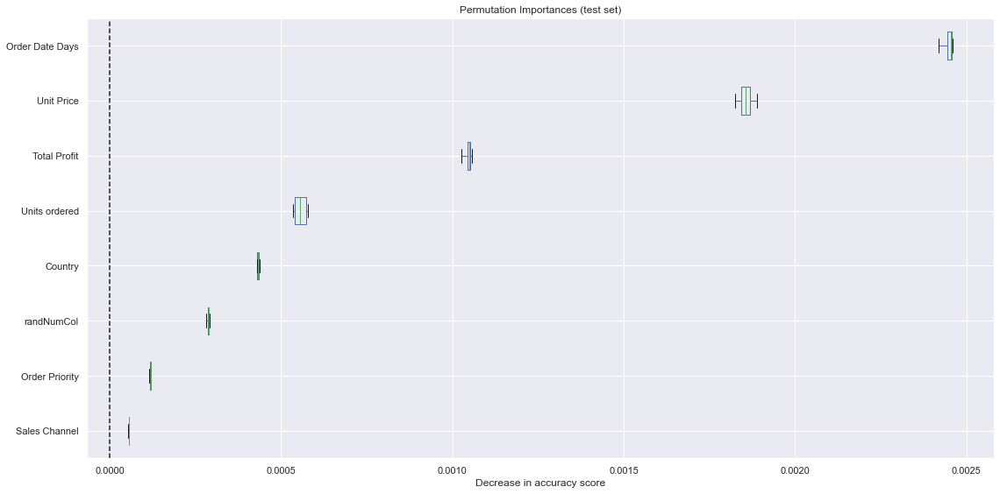

In [45]:
result = permutation_importance(
    rf_FI, df_features, df_target, n_repeats=4, random_state=42, n_jobs=-1, scoring='r2'
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=df_features.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10, figsize=(16,8))
ax.set_title("Permutation Importances (test set)")
# ax.figure(figsize=(16,8))
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()

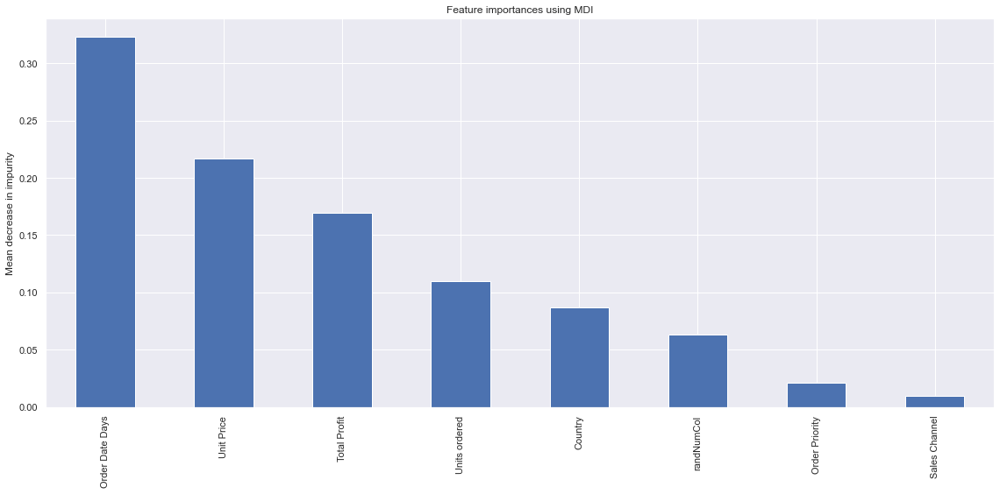

In [46]:
forest_importances = pd.Series(rf_FI.feature_importances_, index=df_features.columns).sort_values(ascending=False)

fig, ax = plt.subplots()
forest_importances.plot.bar(ax=ax, figsize=(16,8))
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

<b>It was seen that Order Priority and Sales Channel had a lower importance in both plots than the random column and hence, we can ignore them going forward. Also Order Date Days and Unit Price were the most important features.</b>

In [47]:
corr_matrix=pd.DataFrame(columns=['Country', 'Order Date Days', 'Total Profit', 'Unit Price', 'Units ordered'])
for country in raw_df['Country'].unique():
    corrs=[country]
    for column in corr_matrix.columns[1:]:
        corrs.append(abs(raw_df[raw_df['Country']==country][column].corr(raw_df[raw_df['Country']==country]['Days to Ship'])))
    corr_matrix.loc[len(corr_matrix)]=corrs
corr_matrix.set_index('Country')
display(corr_matrix.style.background_gradient(cmap='coolwarm', axis=None, vmin=0, vmax=1))

,Country,Order Date Days,Total Profit,Unit Price,Units ordered
0,South Africa,0.016432,0.011566,0.070508,0.003422
1,Morocco,0.008146,0.009129,0.038345,0.007050
2,Papua New Guinea,0.001322,0.007025,0.053199,0.001443
3,Djibouti,0.013887,0.012607,0.008390,0.007046
4,Slovakia,0.016016,0.007225,0.017834,0.002888
5,Sri Lanka,0.000706,0.002041,0.058115,0.012640
6,Seychelles,0.016170,0.018515,0.037677,0.001927
7,Tanzania,0.011326,0.005493,0.054921,0.002714
8,Ghana,0.011980,0.013918,0.048809,0.007050
9,Taiwan,0.009513,0.015469,0.044138,0.012934


<b>For the features that were retained after the previous step, we calculated the correlation of each with the target variable for each country. The idea was to detect any feature interaction between countries and other features, because the shipping time depending on different factors for different countries was a plausible possiblity. However, no such behaviour was observed as all the correlation values were really low. Worth a shot!</b> 

### Analyzing the time series data of 'Days to Ship' vs 'Order Month/Year' for each Item Type or Unit Price

Up until this point, none of the EDA revealed any useful trend in the data. We mostly found uniform distributions, very similar mean values and low correlation across all sections of the data. The last place we have left to look are the two features that showed the highest scores in the feature importance analysis - Item Type/Unit Price and Order Date.

Let us analyze the time series data of mean Days to Ship against each Order Date for 2010 (2010 was taken as a representative year under the assumption that their is no inter-year cyclicity/seasonality because the visualization of the entire data would have been difficult to interpret) for each type of item. Later, this assumption would be verified by plotting the entire time series. For each item type, the mean Days to Ship for each Order Date was plotted. The PACF and ACF plots were also plotted for this time series for each type of item.

ADF test statistic for Fruits is -17.304870 with p-value 0.000000
ADF test statistic for Clothes is -30.204919 with p-value 0.000000
ADF test statistic for Meat is -29.915650 with p-value 0.000000
ADF test statistic for Beverages is -17.901460 with p-value 0.000000
ADF test statistic for Office Supplies is -27.768330 with p-value 0.000000
ADF test statistic for Cosmetics is -31.088362 with p-value 0.000000
ADF test statistic for Snacks is -31.023133 with p-value 0.000000
ADF test statistic for Personal Care is -25.196599 with p-value 0.000000
ADF test statistic for Household is -22.202000 with p-value 0.000000
ADF test statistic for Vegetables is -33.744989 with p-value 0.000000
ADF test statistic for Baby Food is -34.870447 with p-value 0.000000
ADF test statistic for Cereal is -28.107921 with p-value 0.000000


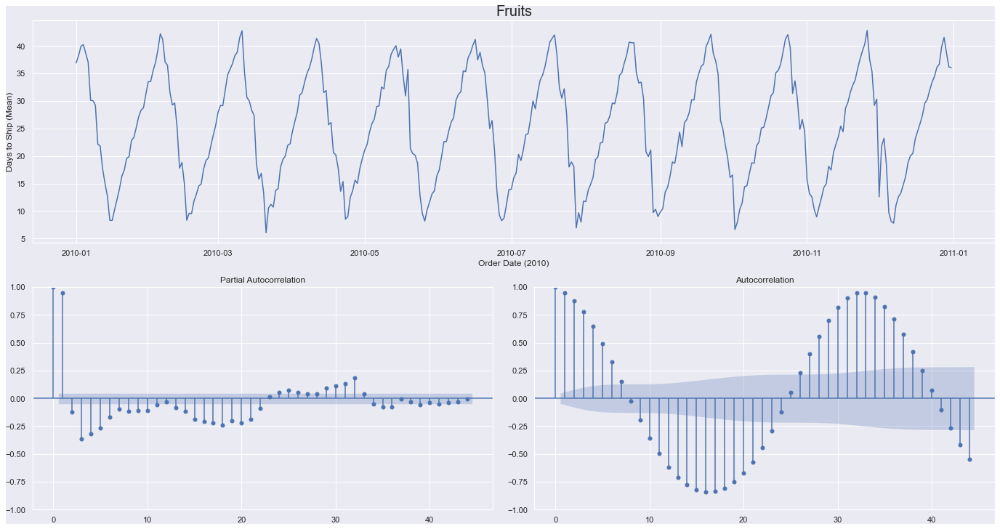

<Figure size 1368x720 with 0 Axes>

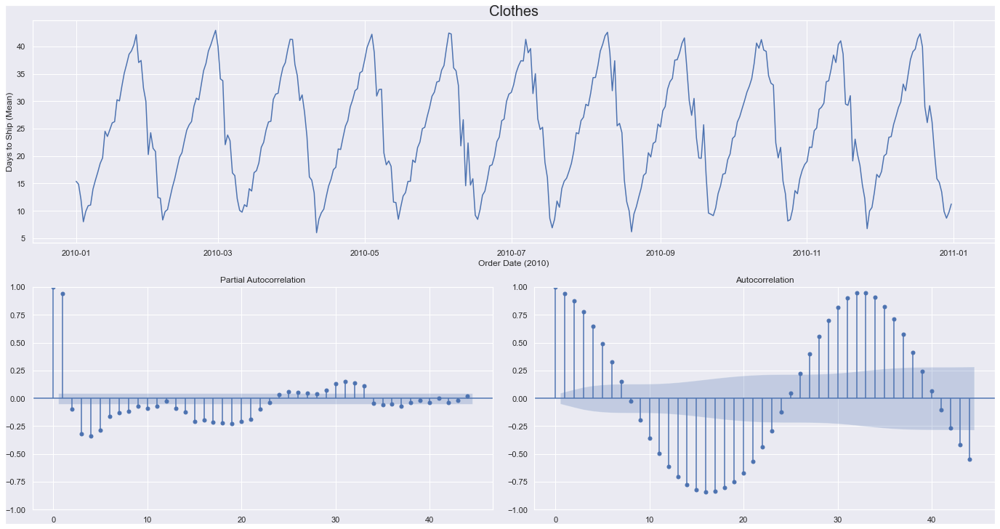

<Figure size 1368x720 with 0 Axes>

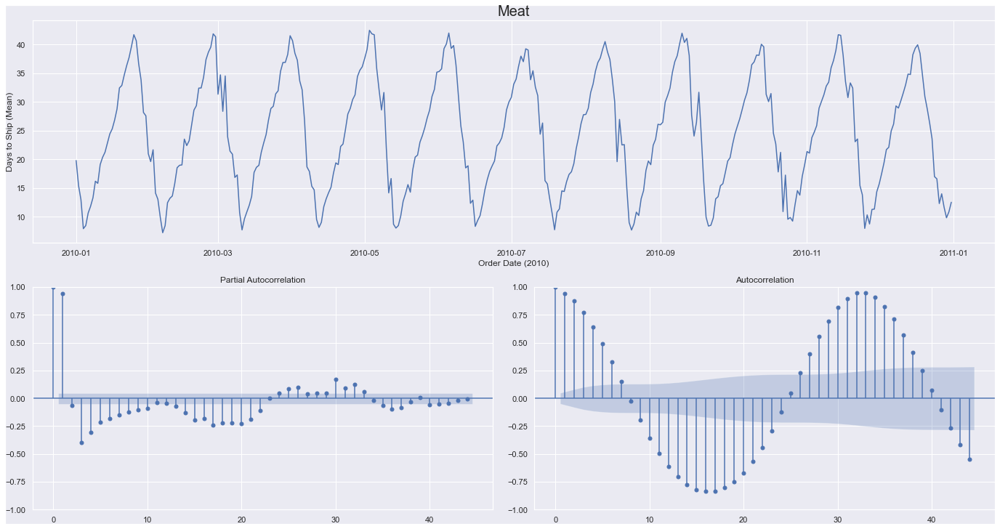

<Figure size 1368x720 with 0 Axes>

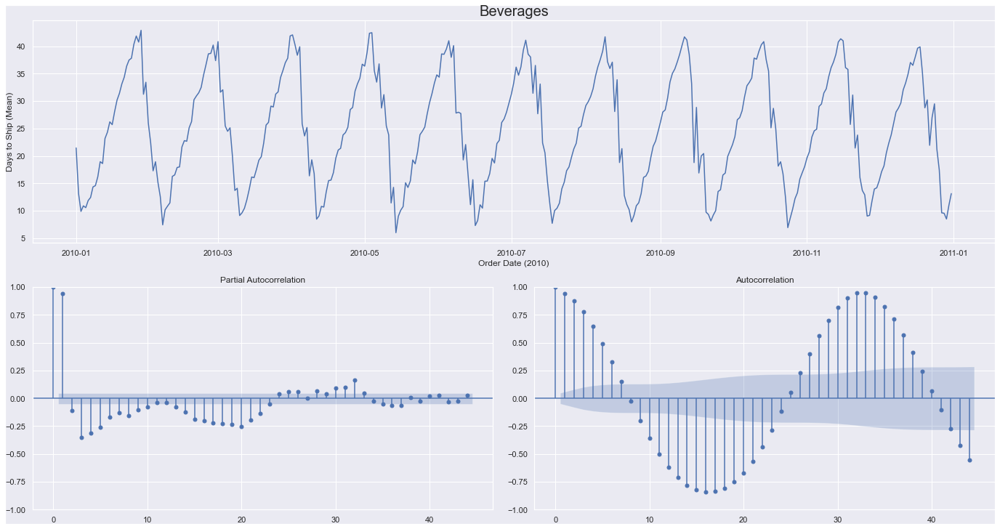

<Figure size 1368x720 with 0 Axes>

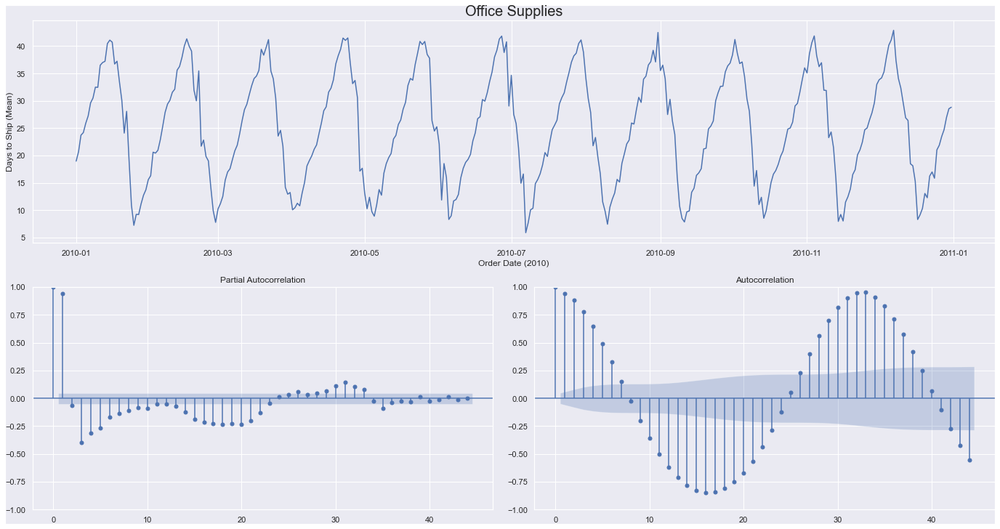

<Figure size 1368x720 with 0 Axes>

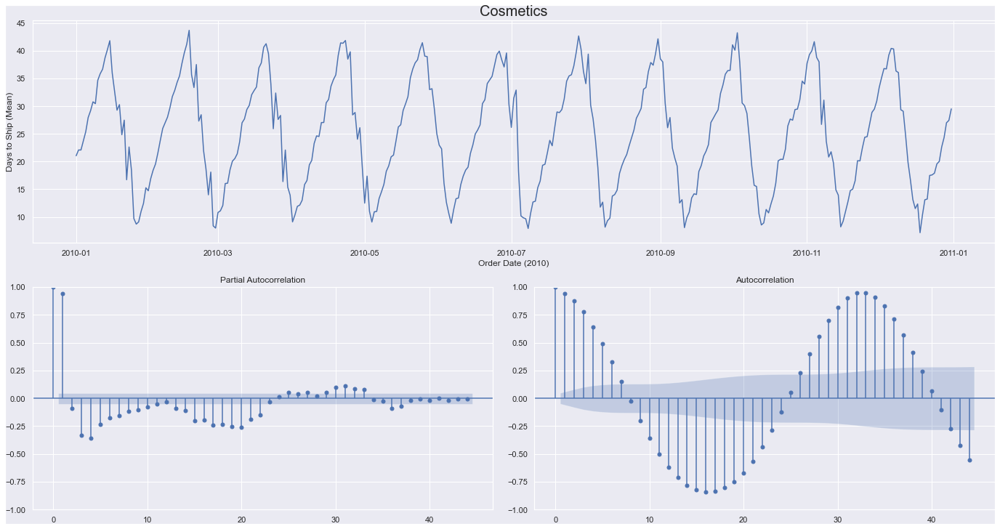

<Figure size 1368x720 with 0 Axes>

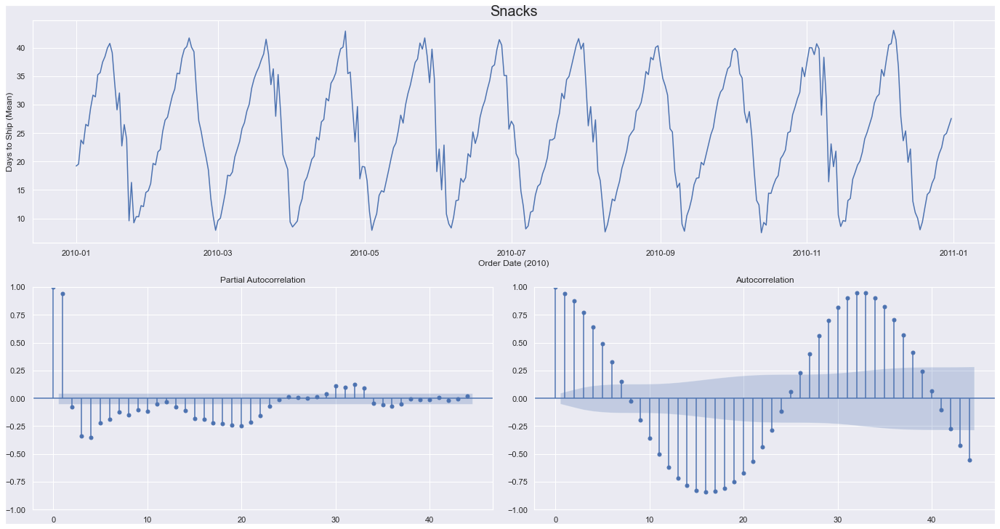

<Figure size 1368x720 with 0 Axes>

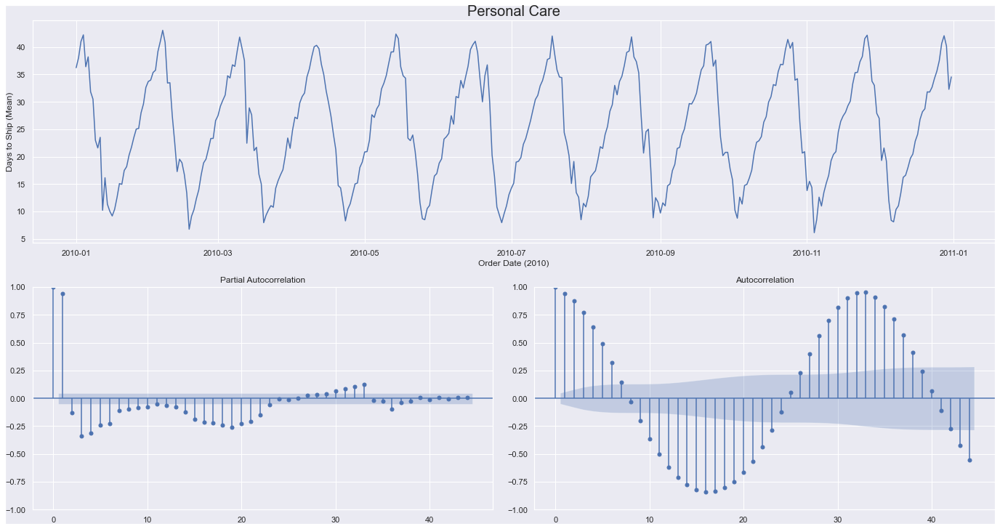

<Figure size 1368x720 with 0 Axes>

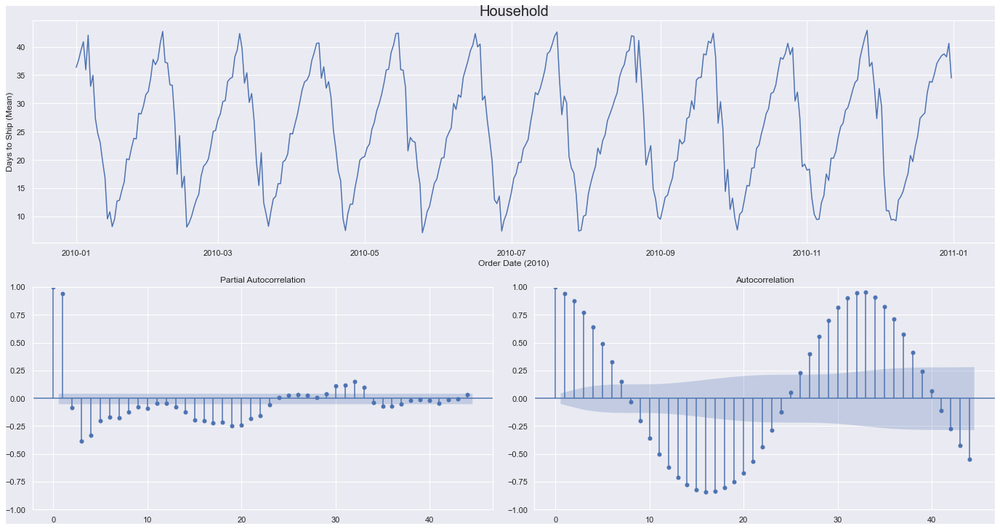

<Figure size 1368x720 with 0 Axes>

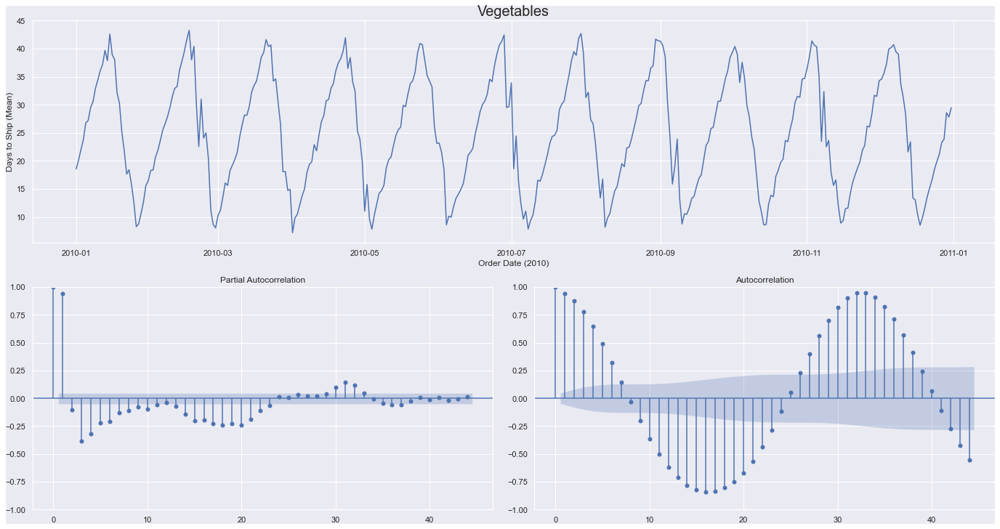

<Figure size 1368x720 with 0 Axes>

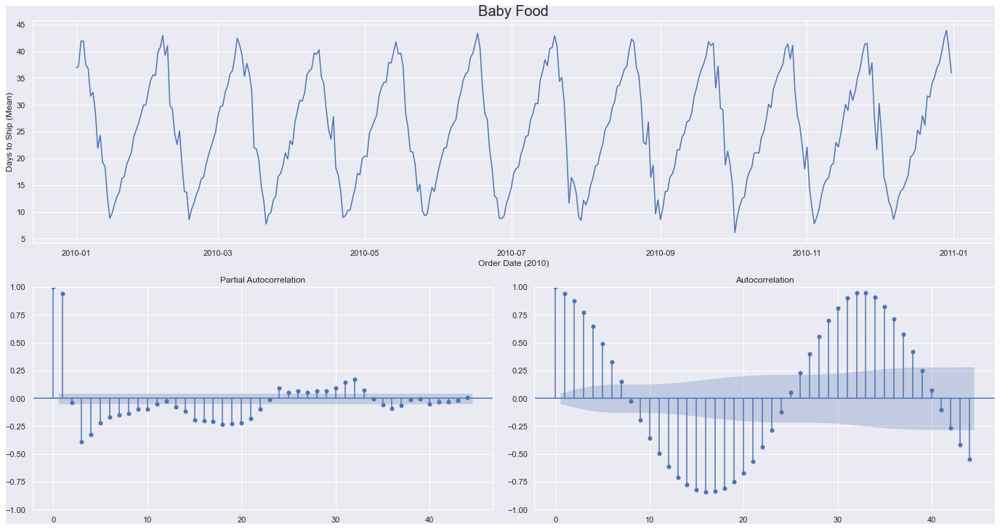

<Figure size 1368x720 with 0 Axes>

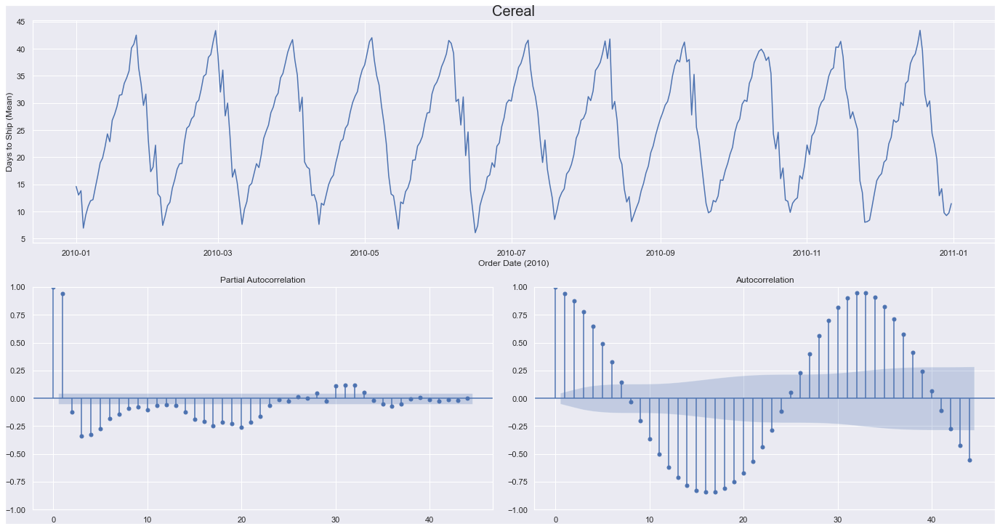

<Figure size 1368x720 with 0 Axes>

In [48]:
orderMonthType=[]
orderMonthTypeWhole=[]
for price in raw_df['Unit Price'].unique():
    orderMonthType.append(pd.DataFrame())
    orderMonthType[len(orderMonthType)-1]=raw_df[(raw_df['Unit Price']==price ) & (raw_df['Order Date']<'2011-01-01')].groupby('Order Date')['Days to Ship'].mean()
    orderMonthTypeWhole.append(pd.DataFrame())
    orderMonthTypeWhole[len(orderMonthTypeWhole)-1]=raw_df[(raw_df['Unit Price']==price )].groupby('Order Date')['Days to Ship'].mean()

for index in range(12):
    fig = plt.figure(constrained_layout=True, figsize=(19,10))
    gs = GridSpec(2, 2, figure=fig)
    itemType=priceToTypeSeries.loc[(raw_df['Unit Price'].unique())[index]]['Item Type']
    plt.xticks([])
    plt.yticks([])
    # create sub plots as grid
    ax1 = fig.add_subplot(gs[0, :])
    plt.figure(figsize=(19,10))
    ax1.plot(orderMonthType[index-1].index, orderMonthType[index-1])
    ax1.set_xlabel("Order Date (2010)")
    ax1.set_ylabel("Days to Ship (Mean)")
    ax1.set_title(itemType, fontsize=20)
    index+=1
    adf=stattools.adfuller(orderMonthTypeWhole[index-1])
    print("ADF test statistic for %s is %f with p-value %f" % (itemType, (adf[0]), (adf[1])))

    sm.graphics.tsa.plot_pacf(orderMonthTypeWhole[index-1], lags=44, method="ywm", alpha=0.01, ax=fig.add_subplot(gs[1,0]))

    sm.graphics.tsa.plot_acf(orderMonthTypeWhole[index-1], lags=44, alpha=0.01, ax=fig.add_subplot(gs[1,1]))
    plt.show

<b>Viola! A pattern was observed at last! The time series of 'Days to Ship' vs 'Order Date' shows a time series pattern with a yearly cyclicity. Augmented Dickey-Fuller test on all the time series reveals p-values of 0 throughout which indicates that the the time series are stationary, which makes them suitable for the ARMA model. But the ACF plot of all the time series are sinusoidal in nature, which means that the order of the MA part can be considered to be zero since the time series can be modeled just by the AR part. Hence, the model to be used becomes simply an AR or autoregression model. The PACF plots mostly show significant correlations upto the 10th lag. This helps us to select the order of the AR models as p=10.</b>

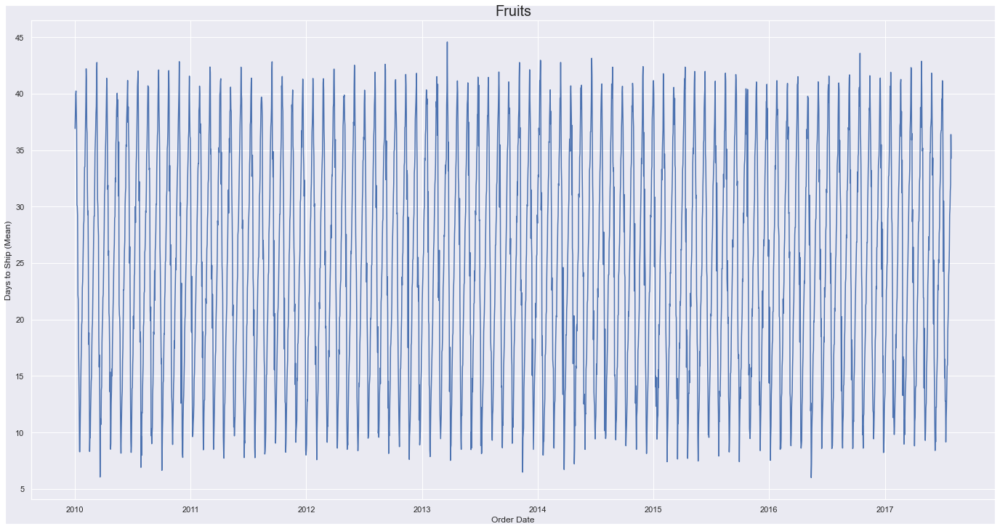

<Figure size 1368x720 with 0 Axes>

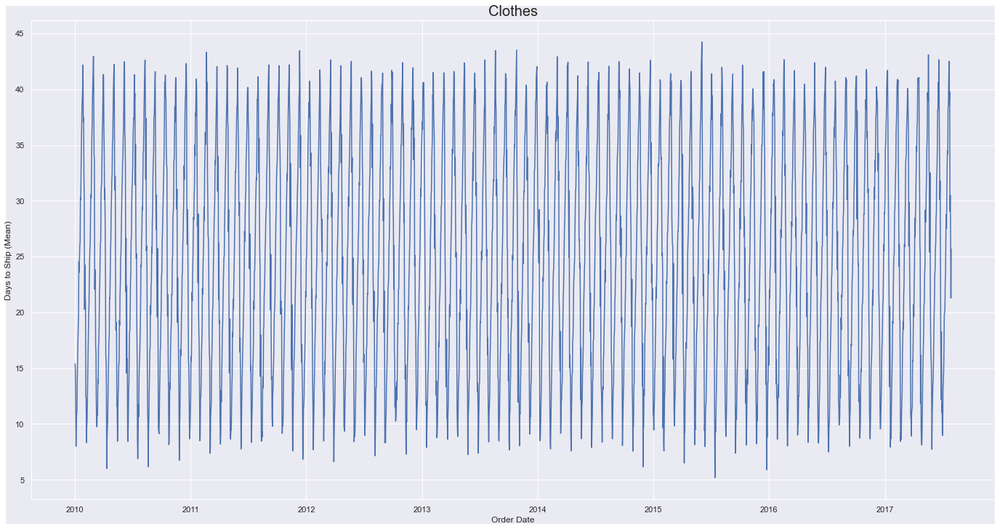

<Figure size 1368x720 with 0 Axes>

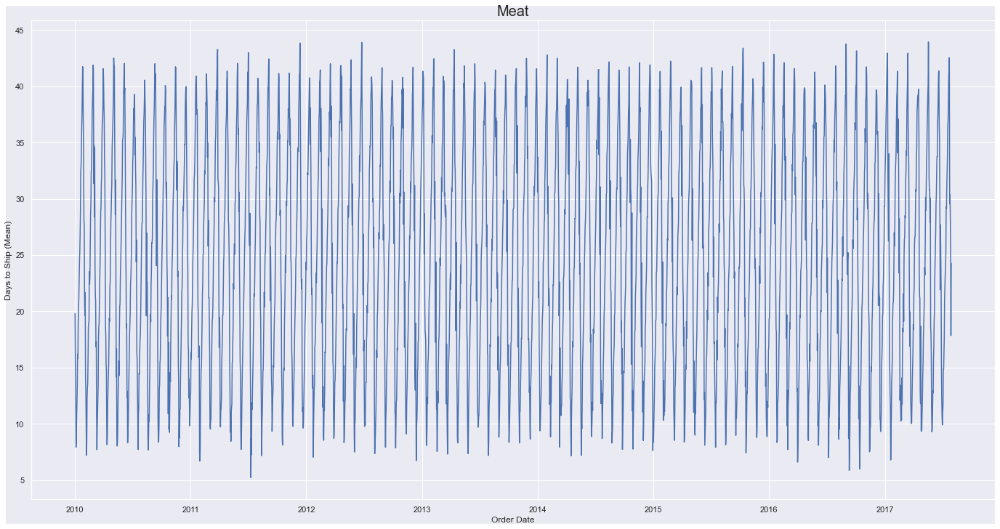

<Figure size 1368x720 with 0 Axes>

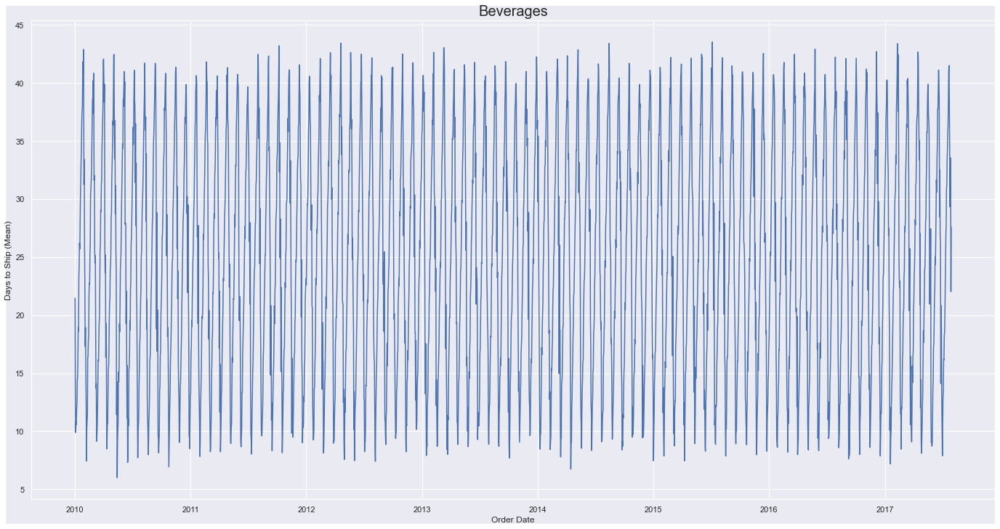

<Figure size 1368x720 with 0 Axes>

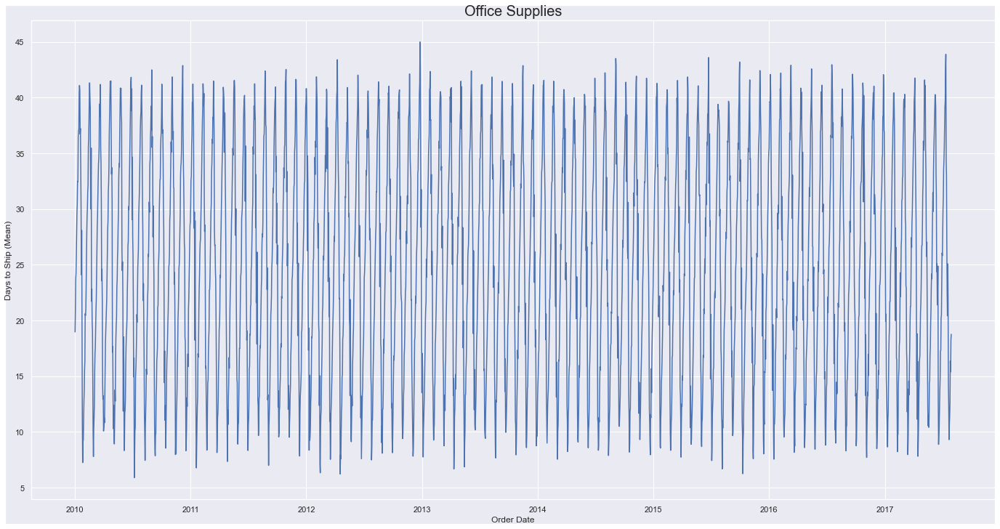

<Figure size 1368x720 with 0 Axes>

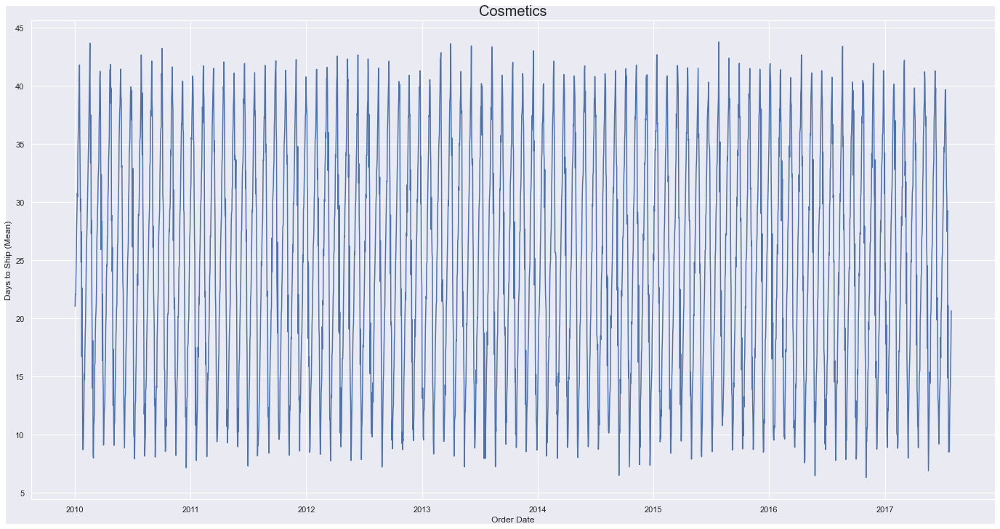

<Figure size 1368x720 with 0 Axes>

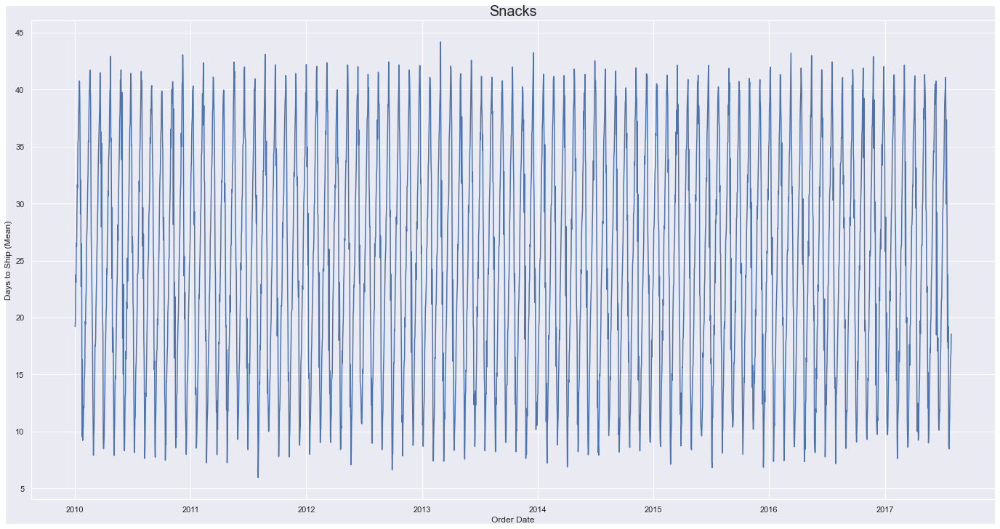

<Figure size 1368x720 with 0 Axes>

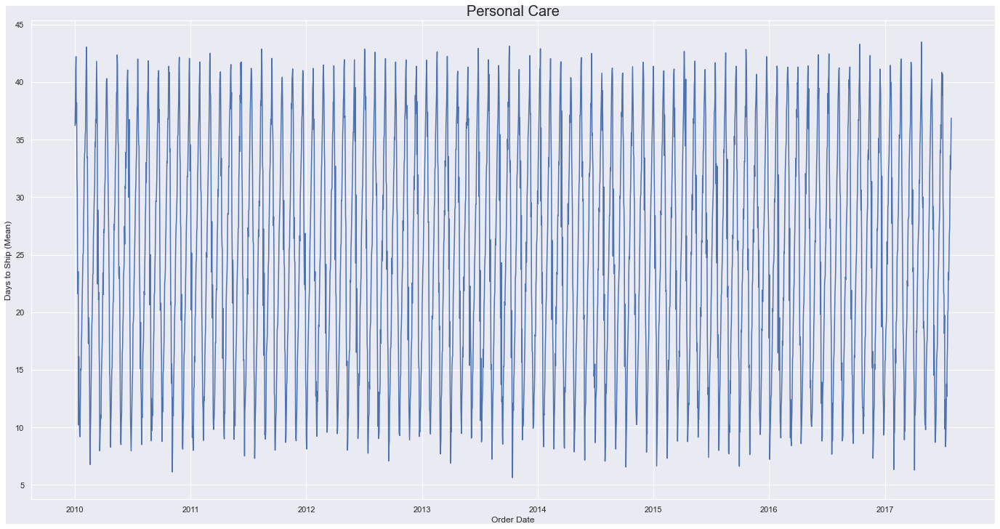

<Figure size 1368x720 with 0 Axes>

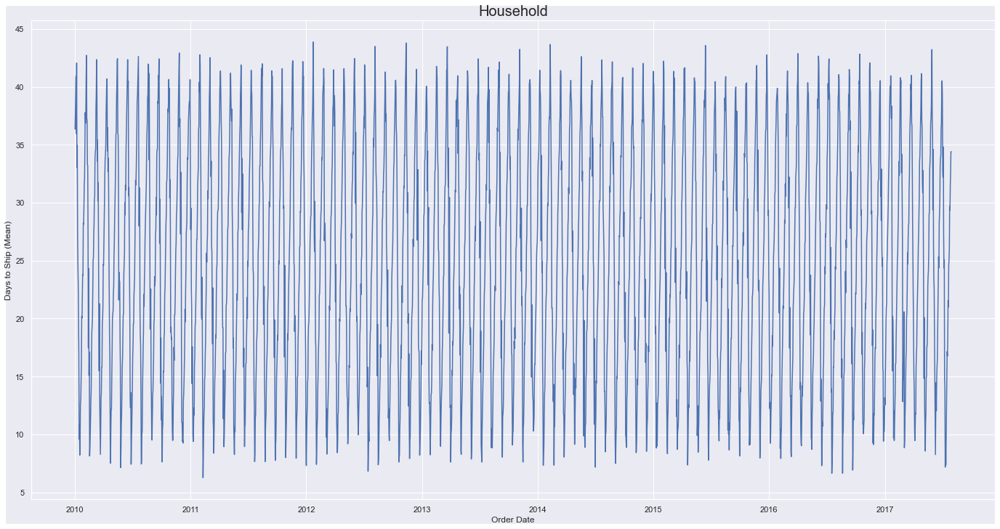

<Figure size 1368x720 with 0 Axes>

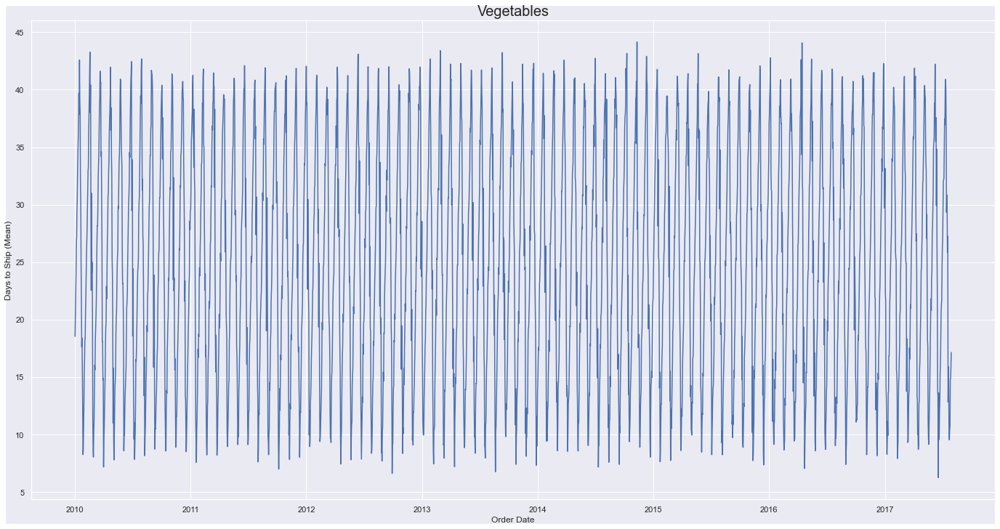

<Figure size 1368x720 with 0 Axes>

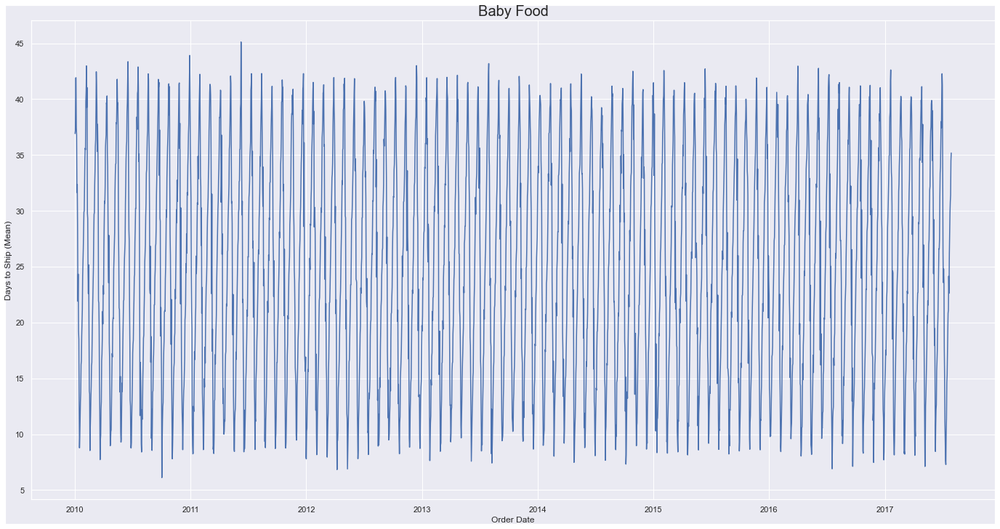

<Figure size 1368x720 with 0 Axes>

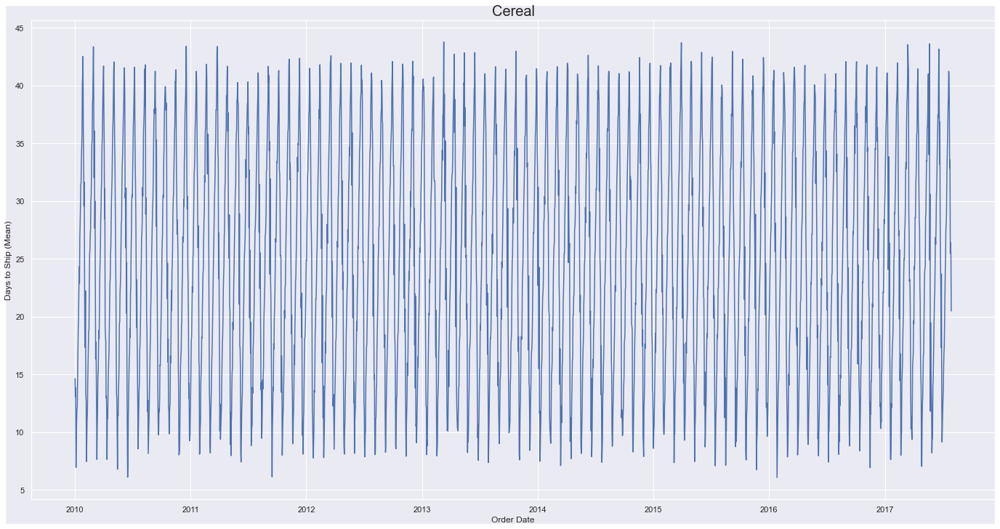

<Figure size 1368x720 with 0 Axes>

In [49]:
orderMonthType=[]
for price in raw_df['Unit Price'].unique():
    orderMonthType.append(pd.DataFrame())
    orderMonthType[len(orderMonthType)-1]=raw_df[(raw_df['Unit Price']==price )].groupby('Order Date')['Days to Ship'].mean()

for index in range(12):
    fig = plt.figure(constrained_layout=True, figsize=(19,10))
    gs = GridSpec(1, 1, figure=fig)
    itemType=priceToTypeSeries.loc[(raw_df['Unit Price'].unique())[index]]['Item Type']
    plt.xticks([])
    plt.yticks([])
    ax1 = fig.add_subplot(gs[0, :])
    plt.figure(figsize=(19,10))
    ax1.plot(orderMonthType[index-1].index, orderMonthType[index-1])
    ax1.set_xlabel("Order Date")
    ax1.set_ylabel("Days to Ship (Mean)")
    ax1.set_title(itemType, fontsize=20)
    index+=1
    plt.show

<b>As we see, the time series does not show much variation across different years and hence, we can treat 2010 as a representative year</b>

# Model building and selection

With the help of the information gathered above, we will fit the following models on the data:

1. Random Forest Classifier: In accordance with the above findings, a Random Forest model was fit with only 'Order Date Days' and 'Unit Price' as features. Other Random Forest models were also fit behind the scenes with incrementaly more number of features to test whether the added features affect the performance, and as expected, they performed poorly as compared to the first model.

2. AR model: We shall fit an autoregression model each on the mean value of the target agaisnt each Date of Order for each Item Type. Here, the predictions will be made at a Item Type and Order Date level (All orders on a certain date will have the same predicted 'Days to Ship' for each Item Type).

### Random Forest

In [50]:
df_features['Country']=raw_df['Country']
df_features=df_features.loc[:,['Order Date Days', 'Unit Price']]
X_train_split, X_test_split, y_train_split, y_test_split = train_test_split(df_features, df_target,random_state=2)

In [51]:
parameters={'n_estimators':[8], 'n_jobs':[-1], 'max_features':[2], 'max_depth':[100], 'verbose':[3], 'random_state': [12]}
#The actual training process involved a wide array of hyperparameters for hyperparameter tuning, 
#but only the best selected parameters have been included here for the sake of reducing the runtime of this notebook.

clfrf = GridSearchCV(RandomForestRegressor(), parameters, scoring='r2', n_jobs=-1, verbose=3)
clfrf.fit(X_train_split,y_train_split)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   38.0s remaining:   57.1s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   38.5s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


building tree 1 of 8building tree 2 of 8

building tree 3 of 8building tree 4 of 8

building tree 5 of 8
building tree 6 of 8
building tree 7 of 8building tree 8 of 8



[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    9.7s remaining:   29.3s
[Parallel(n_jobs=-1)]: Done   5 out of   8 | elapsed:   10.6s remaining:    6.3s
[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:   12.1s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:   12.1s finished


GridSearchCV(estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [100], 'max_features': [2],
                         'n_estimators': [8], 'n_jobs': [-1],
                         'random_state': [12], 'verbose': [3]},
             scoring='r2', verbose=3)

In [52]:
clfrf.cv_results_  #For feature set = ['Order Date Days', 'Unit Price' ]

{'mean_fit_time': array([37.67437558]),
 'std_fit_time': array([0.68972324]),
 'mean_score_time': array([0.21244903]),
 'std_score_time': array([0.06058306]),
 'param_max_depth': masked_array(data=[100],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_max_features': masked_array(data=[2],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_n_estimators': masked_array(data=[8],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_n_jobs': masked_array(data=[-1],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_random_state': masked_array(data=[12],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_verbose': masked_array(data=[3],
              mask=[False],
        fill_value='?',
             dtype=object),
 'params': [{'max_depth': 100,
   'max_features': 2,
   'n_estimators': 8,
   'n_jobs': -1,
   

In [72]:
results_df_y=clfrf.predict(X_test_split)
results_df=X_test_split.copy()
results_df['Days to Ship']=results_df_y
print("RMSE for the model: %f" % (mean_squared_error(y_test_split, results_df_y, squared=False)))
print("MAE for the model: %f" % (mean_absolute_error(y_test_split, results_df_y)))

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   2 out of   8 | elapsed:    0.1s remaining:    0.5s


RMSE for the model: 11.507228
MAE for the model: 8.347200


[Parallel(n_jobs=8)]: Done   5 out of   8 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=8)]: Done   8 out of   8 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=8)]: Done   8 out of   8 | elapsed:    0.2s finished


In [73]:
results_df['Days to Ship']=results_df_y
results_df=results_df.merge(raw_df['orderMonth'], left_index=True, right_index=True)
check_df=results_df.loc[:,['Days to Ship']].merge(raw_df.loc[:,['Item Type', 'Order Date', 'Days to Ship']], left_index=True, right_index=True, suffixes=('_predicted', '_actual'))
check_df.head(60)

,Days to Ship_predicted,Item Type,Order Date,Days to Ship_actual
309190,19.939837,Household,2014-10-20,17
240953,24.691174,Cereal,2014-05-08,20
609687,14.783917,Office Supplies,2013-09-24,20
757042,31.879584,Household,2010-05-19,32
788110,16.329052,Office Supplies,2017-06-26,24
804555,22.885026,Cosmetics,2012-07-21,6
194524,16.297171,Cereal,2015-11-05,10
744168,32.775737,Office Supplies,2016-11-28,46
451171,23.466121,Clothes,2012-05-09,20
134273,11.636816,Meat,2015-09-20,11


<b>An RMSE score of 11.5 and MSE of 8.3 was observed.

Now, let us visulize the predictions of the model by grouping the predictions by Order Date and taking the mean for each item type, just like we had done previously for the actual data, but this time, will use data for the time period - July 2016 to July 2017 i.e. about the last one year of the data</b>

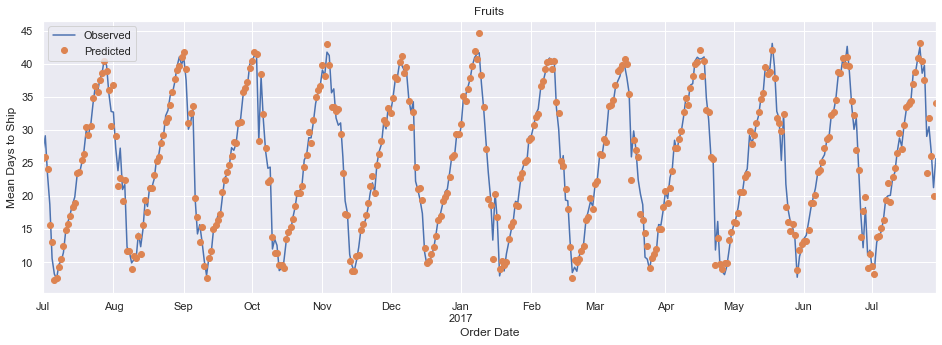

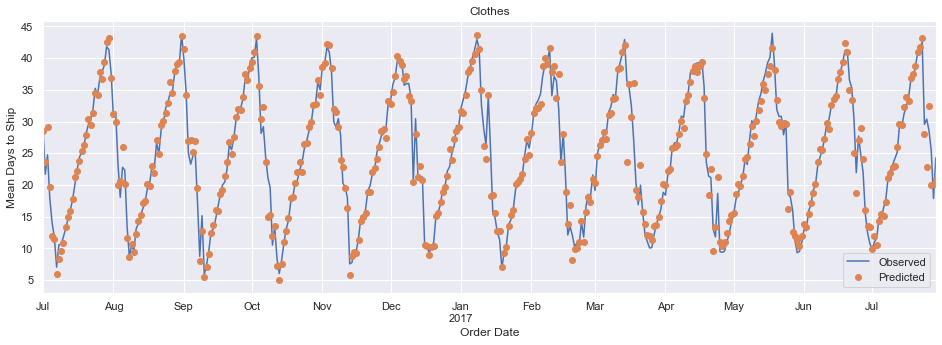

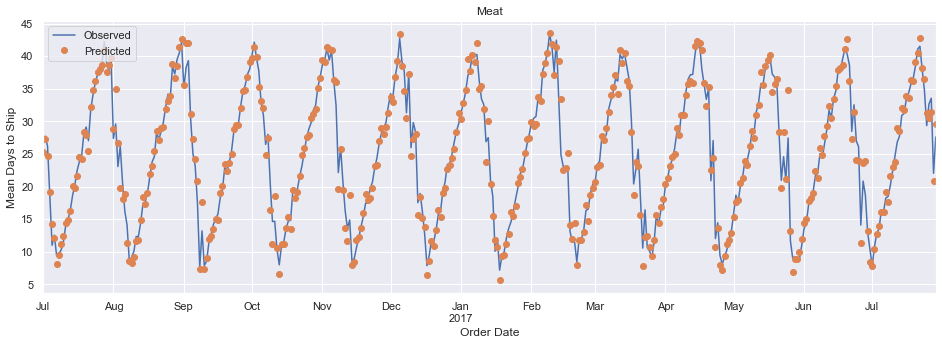

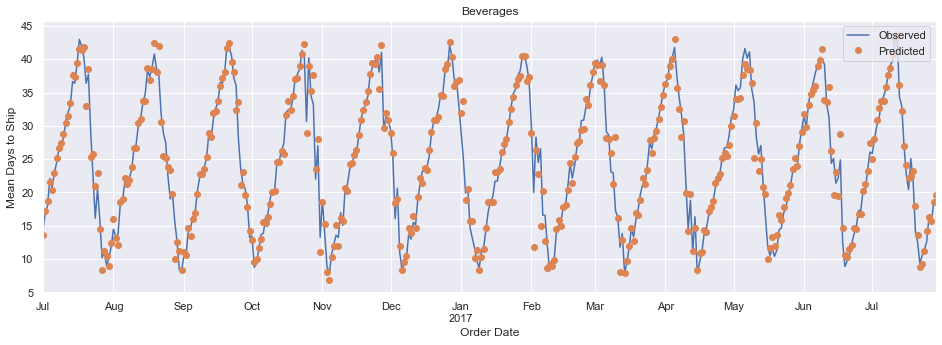

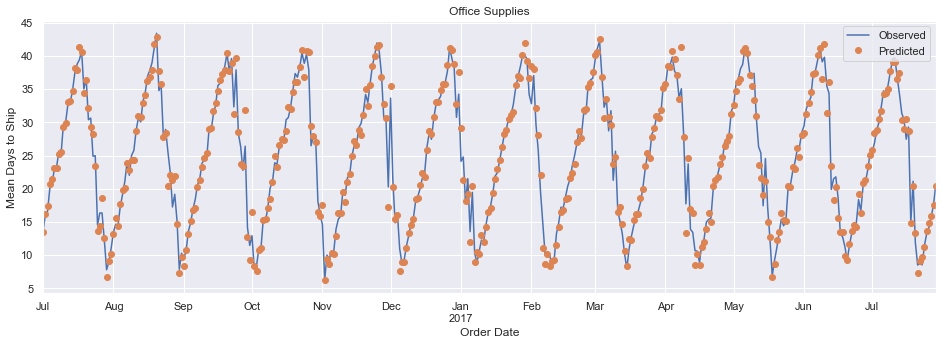

...

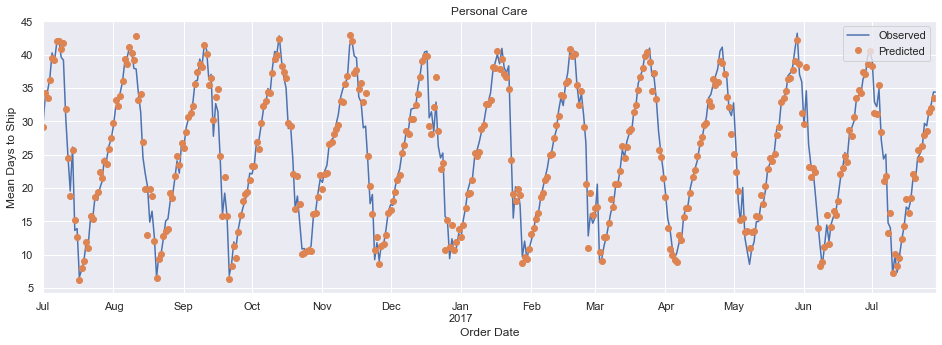

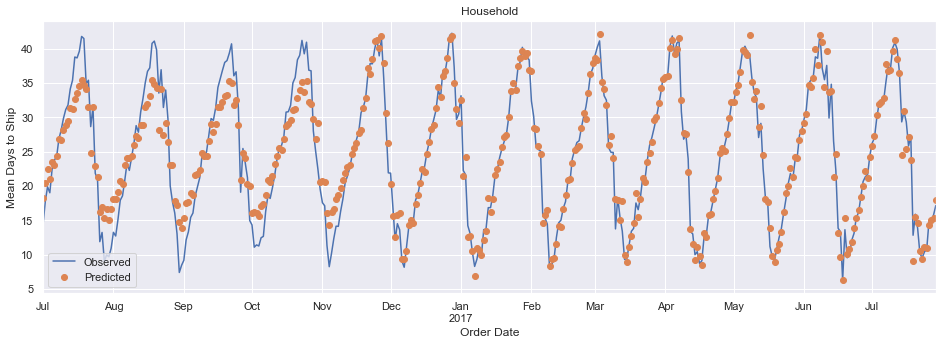

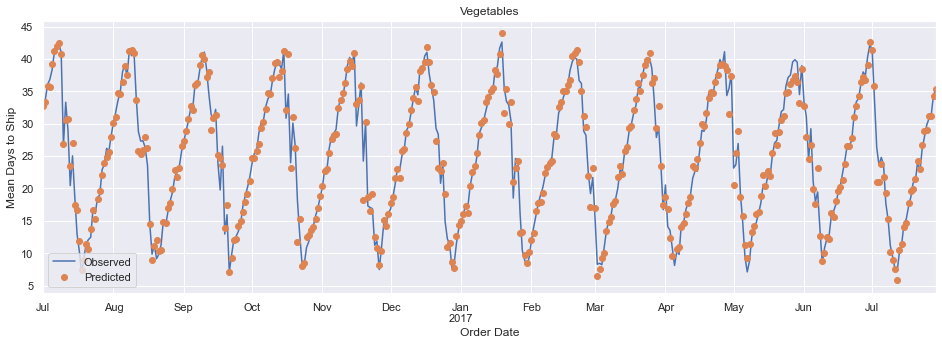

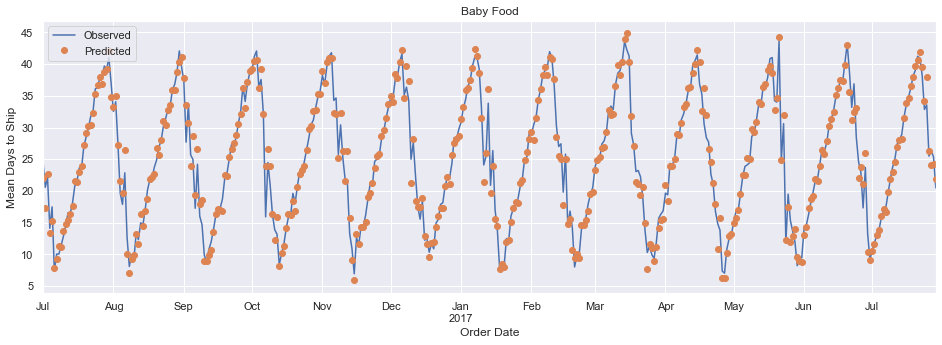

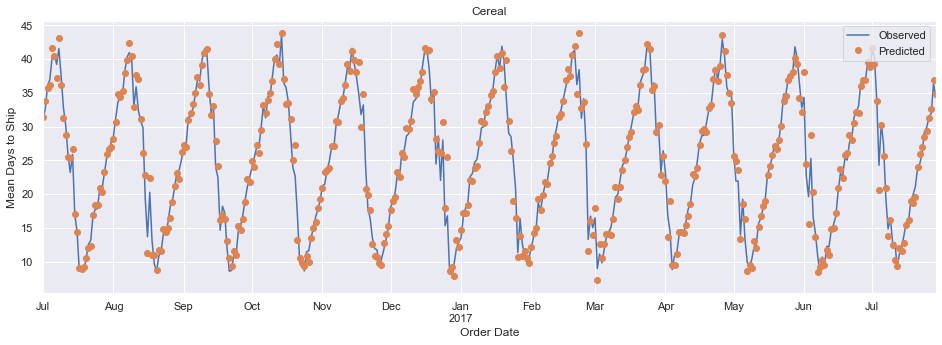

In [74]:
for price in raw_df['Unit Price'].unique():
    X=raw_df[raw_df['Unit Price']==price].loc[:,['Order Date', 'Days to Ship']].copy()
    X_grouped=X.groupby('Order Date')['Days to Ship'].mean()
    X_grouped.sort_index(inplace=True)
    X_train, X_test = X_grouped, X_grouped.iloc[100:]
    ax = X_grouped[X_grouped.index>'2016-06-30'].plot(label='Observed')
    results_plot_df=results_df.copy()
    results_plot_df['Order Date']=results_plot_df['Order Date Days'].apply(lambda x: datetime.strptime('2010-01-01', '%Y-%m-%d')+timedelta(days=x))
    results_plot_df=results_plot_df[(results_plot_df['Order Date']>'2016-06-30') & (results_plot_df['Unit Price']==price)]
    results_plot_df=results_plot_df.groupby('Order Date')['Days to Ship'].mean()
    plt.plot(results_plot_df.index, results_plot_df, 'o', label='Predicted')
    ax.set_xlabel('Order Date')
    ax.set_ylabel('Mean Days to Ship')
    ax.set_title(priceToTypeSeries.loc[price]['Item Type'])
    plt.legend()
    plt.show()

<b>As we can see, the predictions on the test data seem to be following the actual data pretty well.</b>

### Autoregression model

An AR model was fit for the time series corresponding to each item type. For validation purpouses, the walk-forward validation technique was employed on the AR model for each item type. The following general steps were involved:

1. The last 90 days' data was used for model evaluation. The AR model was iteratively fit on the entire data except the i last dates and the one-step-ahead forecast was made for the i-th date on each iteration where i varied from 90 to 1. This was to ensure that the test set and training set stayed separated and there was no data leakage. This was obviously done for all tiem types.
2. The prediction for each iteration was plotted against the actual data for visualization.
3. The predictions for each date, for each item type was recorded. This would be the prediction data that we will evaluate against the actual data.

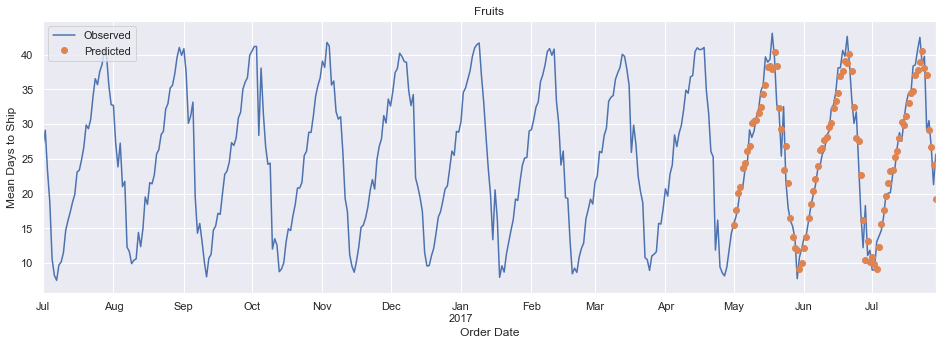

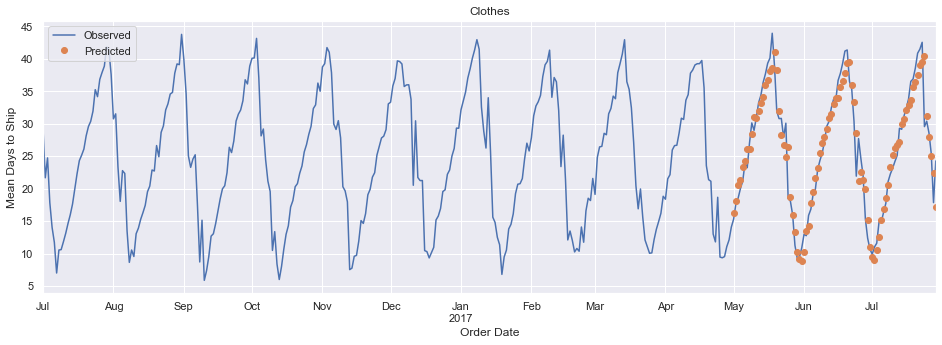

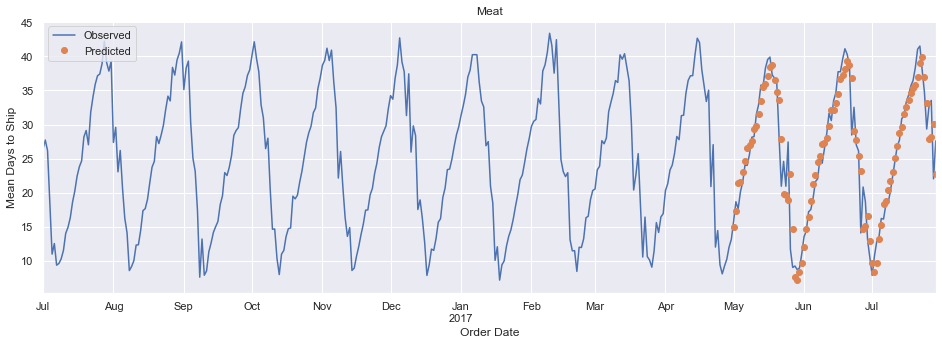

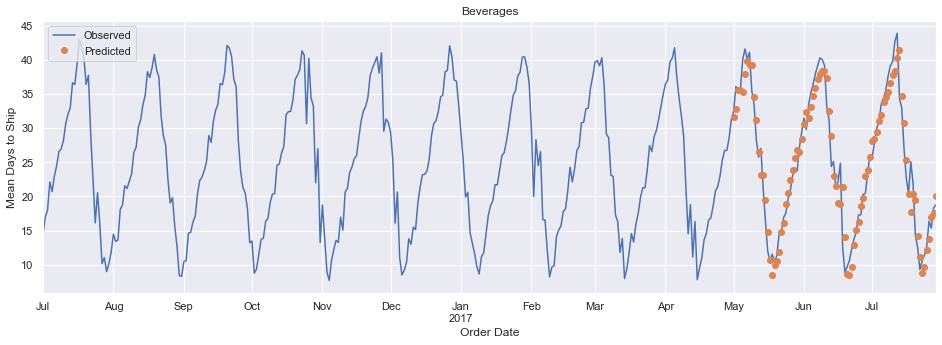

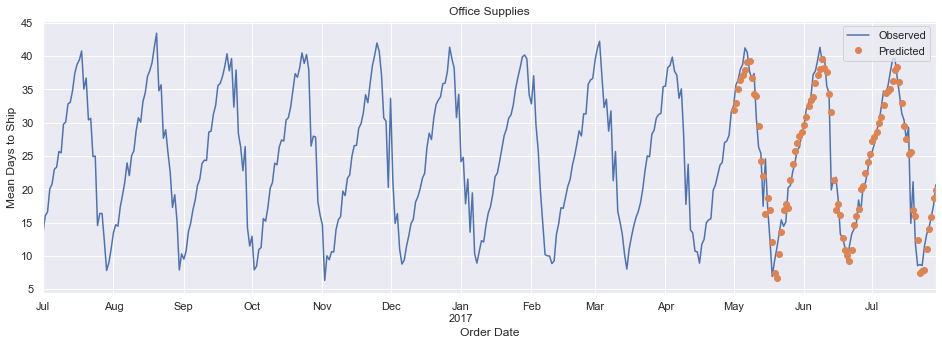

...

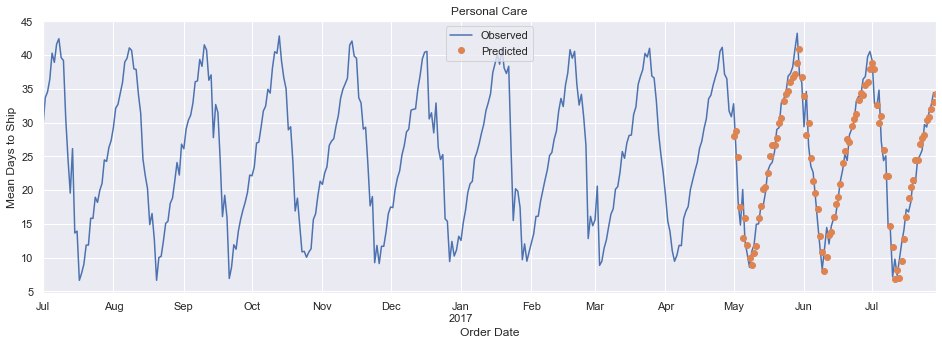

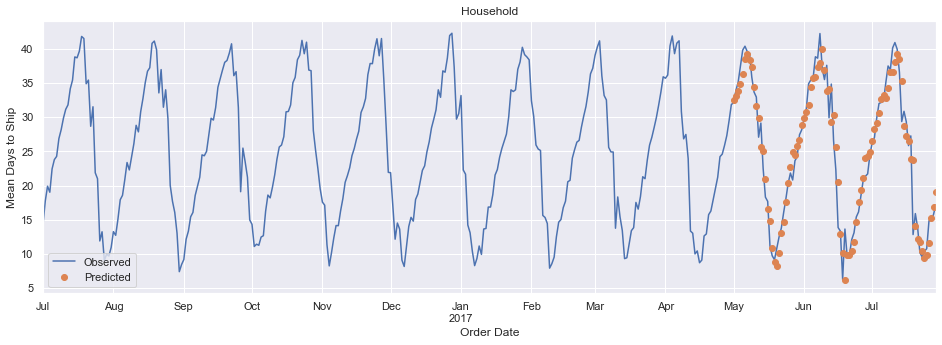

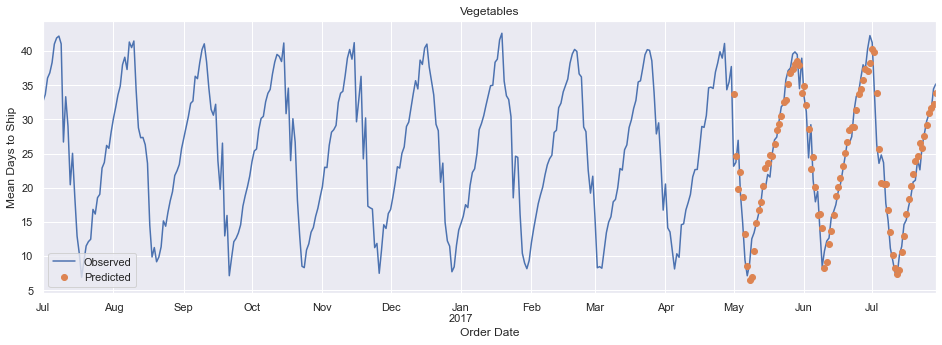

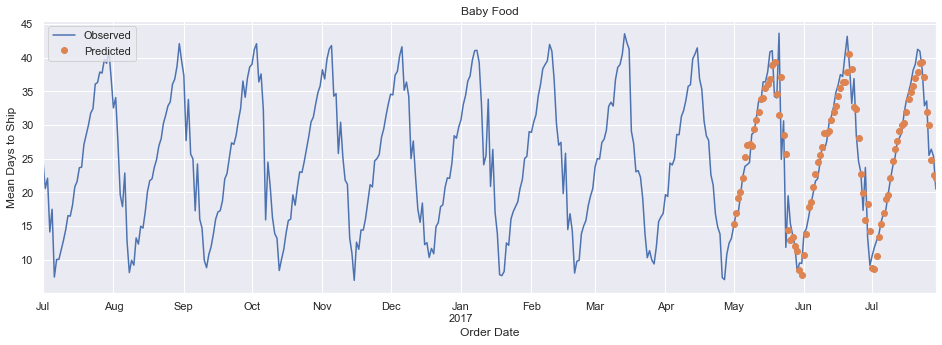

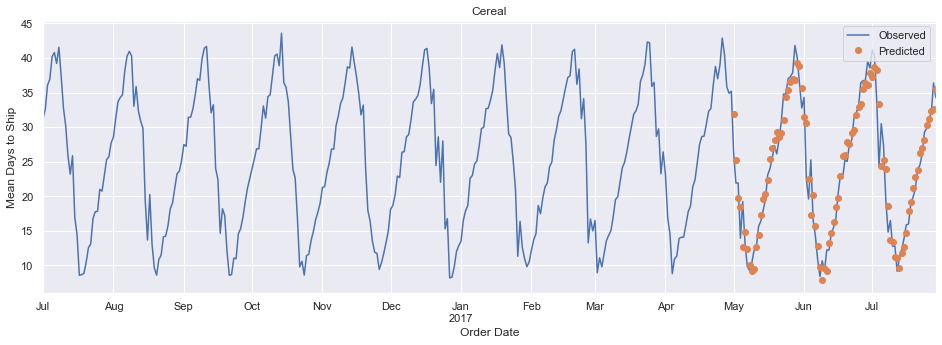

In [62]:
tsaggresults=pd.DataFrame(columns=['Order Date', 'Predicted Days to Ship', 'Unit Price'])
for price in raw_df['Unit Price'].unique():
    X=raw_df[raw_df['Unit Price']==price].loc[:,['Order Date', 'Days to Ship']].copy()
    X_grouped=X.groupby('Order Date')['Days to Ship'].mean()
    X_grouped.sort_index(inplace=True)
    tssresult=[]
    for i in range(-90, 0, 1):

        X_train, X_test = X_grouped.iloc[:i], X_grouped.iloc[100:]
        model=sm.tsa.ARIMA(X_train, order=(10, 0, 0))
        model_fit=model.fit()
        tssresult.append({'index': model_fit.forecast().index[0], 'predicted_mean': model_fit.forecast()})
    tssresult=pd.DataFrame(tssresult)
    ax = X_grouped[X_grouped.index>'2016-06-30'].plot(label='Observed')
    plt.plot(tssresult['index'], tssresult['predicted_mean'], 'o', label='Predicted')

    ax.set_xlabel('Order Date')
    ax.set_ylabel('Mean Days to Ship')
    ax.set_title(priceToTypeSeries.loc[price]['Item Type'])
    temp_df=tssresult.rename(columns={'index':'Order Date', 'predicted_mean':'Predicted Days to Ship'})
    temp_df['Unit Price']=price
    tsaggresults=tsaggresults.append(temp_df, ignore_index=True)
    plt.legend()
    plt.show()

<b>We see that the predictions follow the actual data really closely in this case as well.
    
Let us now move forward to the objective evaluation of the model:</b>

In [63]:
tstest_df=raw_df.loc[:,['Order Date', 'Days to Ship', 'Unit Price']]   #Gathering the actual target data

tsaggresults=pd.merge(tsaggresults, tstest_df, how='left', on=['Order Date', 'Unit Price'])   #Merging the actual and the predicted data

print("RMSE for the model: %f" % (mean_squared_error(tsaggresults['Days to Ship'], tsaggresults['Predicted Days to Ship'], squared=False)))
print("MAE for the model: %f" % (mean_absolute_error(tsaggresults['Days to Ship'], tsaggresults['Predicted Days to Ship']
)))

RMSE for the model: 11.316875
MAE for the model: 7.983826


<b>The predicted results contains a predicted target value for each date, for each item type. So, this dataframe was merged with the actual data on the 'Order Date' and 'Unit Price' (representing the item type) columns.
    
Note that the raw data is not grouped by date, so there would be multiple rows with the same date for each item type. All of these rows would get the same prediction (for a single item type) because we have made predictions at a order date and item type level.
    
An RMSE score of 11.32 and an MAE score of 7.98 was observed for the AR model.
</b>

# Conclusion

As discussed above, we were successful in uncovering the underlying longitudinal data from the given data which seemed to be patternless on the surface and we fit a Random Forest model and an autoregressive model (for each item type) on the data to model it.

As we can see above, the performance of both the models were very similar, with the autoregressive model based approach achieving marginally better evaluation scores. Hence, we may use the autoregressive model approach to predict future values for this data using the one-step-ahead forecasting approach. 